# Co-add spectra along nebular axis

In [1]:
from pathlib import Path
import yaml
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.convolution import Gaussian2DKernel, Gaussian1DKernel, convolve_fft
from matplotlib import pyplot as plt
import seaborn as sns

import mes_longslit as mes

/Users/will/Dropbox/teresa-pn-ou5/.venv/lib/python3.11/site-packages/FITS_tools/__init__.py:33: UserWarning: module 'astropy.config.configuration' has no attribute 'update_default_config', which has been deprecated in astropy 6.1.1.
  warn(wmsg)


In [2]:
dpath = Path.cwd().parent / "data"
pvpath = dpath / "pvextract"

In [3]:
slit_db_list = yaml.safe_load(
    (dpath / "slits-ha.yml").read_text()
)

Find list of all ha slits that are close to axis. Use ones that mention "center" in their comments.

In [4]:
id_list = [_["slit_id"] for _ in slit_db_list if "center" in _["comment"]]

In [5]:
id_list

['N10036',
 'N20012',
 'spm0048o',
 'spm0054o',
 'spm0105o',
 'spm0211o',
 'spm0432o']

In [6]:
_id = id_list[0]

In [7]:
hdu, = fits.open(pvpath / f"{_id}-ha.fits")

In [8]:
w = WCS(hdu.header, key="A")
w

WCS Keywords

Number of WCS axes: 3
CTYPE : 'AWAV' 'RA---TAN' 'DEC--TAN' 
CRVAL : 6.5577767803892e-07 318.58461345881 43.645363660227 
CRPIX : 1.0 1.0 1.0 
PC1_1 PC1_2 PC1_3  : 1.0 0.0 0.0 
PC2_1 PC2_2 PC2_3  : 0.0 -0.0039645479926298 -0.99999214114873 
PC3_1 PC3_2 PC3_3  : 0.0 0.99999214114873 -0.0039645479926298 
CDELT : 5.466290563345e-12 9.7371246546866e-05 9.7371246546866e-05 
NAXIS : 183  998  1

In [9]:
w.wcs.restwav

6.56279e-07

In [10]:
hdu.header["WEIGHT"]

0.5956792141544897

In [11]:
w0 = WCS(hdu.header).sub(2)
w0

WCS Keywords

Number of WCS axes: 2
CTYPE : 'LINEAR' 'LINEAR' 
CRVAL : 6557.7767803892 0.0 
CRPIX : 1.0 481.10893041177 
CD1_1 CD1_2  : 1.0 0.0 
CD2_1 CD2_2  : 0.0 0.0546629056334496 
NAXIS : 183  998

[]

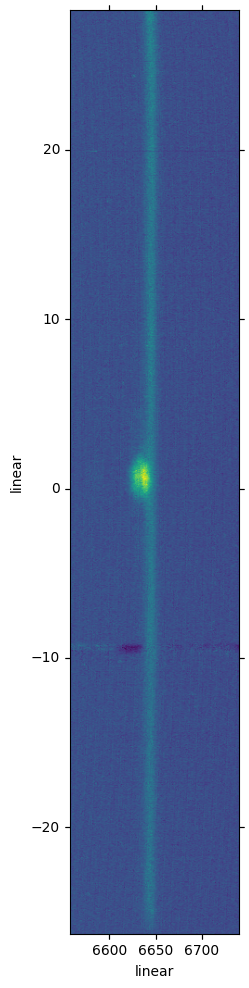

In [12]:
fig, ax = plt.subplots(
    figsize=(5, 12),
    subplot_kw=dict(projection=w0)
)
ax.imshow(hdu.data[0])
ax.set(
#    ylim=[-10, 10],
)

In [13]:
T = ax.get_transform("world")

In [14]:
T.transform_point([6563.0, 0])

array([176.83342176, 576.97259689])

In [15]:
c0 = SkyCoord("21 14 20.03 +43 41 36.0", unit=(u.hourangle, u.deg))
c0.ra.deg, c0.dec.deg

(318.58345833333334, 43.69333333333333)

In [16]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="ha", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-ha-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-ha-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0054o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0054o-ha-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0211o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0211o-ha-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0048o-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0048o-ha-PA000-sep+001.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-ha.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10036-ha-PA3

In [17]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="oiii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10045-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10045-oiii-PA359-sep+005.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10039-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10039-oiii-PA359-sep+002.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0056o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0056o-oiii-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N20006-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N20006-oiii-PA359-sep+004.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0023o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0023o-oiii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0050o-oiii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/s

In [18]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="heii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-heii-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N10036-heii-PA359-sep+002.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-heii-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0021o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0021o-heii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N20004-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N20004-heii-PA359-sep+004.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0215o-heii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-ve

In [19]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="nii", verbose=True)

Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0440o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0440o-nii-PA085-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0021o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0021o-nii-PA000-sep+008.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0601o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0601o-nii-PA000-sep-006.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0211o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0211o-nii-PA000-sep+000.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/spm0105o-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/spm0105o-nii-PA000-sep-003.fits
Processing /Users/will/Dropbox/teresa-pn-ou5/data/pvextract/N10036-nii.fits
Writing /Users/will/Dropbox/teresa-pn-ou5/data/pv-offset-vels/N1

In [20]:
mes.convert_pv_offset_vels(c0.ra.deg, c0.dec.deg, line_id="niis", verbose=True)

In [21]:
pvpath = dpath / "pv-offset-vels"

In [22]:
def fkey(filepath):
    "Extract integer slit offset for sorting"
    stem = str(filepath.stem).replace("-regrid", "")
    return int(stem[-4:])

In [23]:
file_list = sorted(pvpath.glob("*-oiii-*.fits"), key=fkey)
[_.stem for _ in file_list]

['spm0107o-oiii-PA000-sep-002',
 'spm0056o-oiii-PA000-sep+000',
 'N10039-oiii-PA359-sep+002',
 'spm0050o-oiii-PA000-sep+003',
 'N20006-oiii-PA359-sep+004',
 'N10045-oiii-PA359-sep+005',
 'spm0023o-oiii-PA000-sep+008']

In [24]:
id_list

['N10036',
 'N20012',
 'spm0048o',
 'spm0054o',
 'spm0105o',
 'spm0211o',
 'spm0432o']

Look at a single slit

In [25]:
hdu, = fits.open(file_list[3])

In [26]:
w = WCS(hdu.header)
w

WCS Keywords

Number of WCS axes: 2
CTYPE : 'VHEL' 'LINEAR' 
CRVAL : -284.80661705145 0.0 
CRPIX : 1.0 317.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 3.8591890042708 0.52596317763292 
NAXIS : 155  655

In [27]:
hdu.header["OFFSET"], hdu.header["WEIGHT"]

(3.0138791711125124, 3.57475841997416)

[(44.51883980321227, 85.97832774820145),
 (258.9617865360575, 373.0382134639425)]

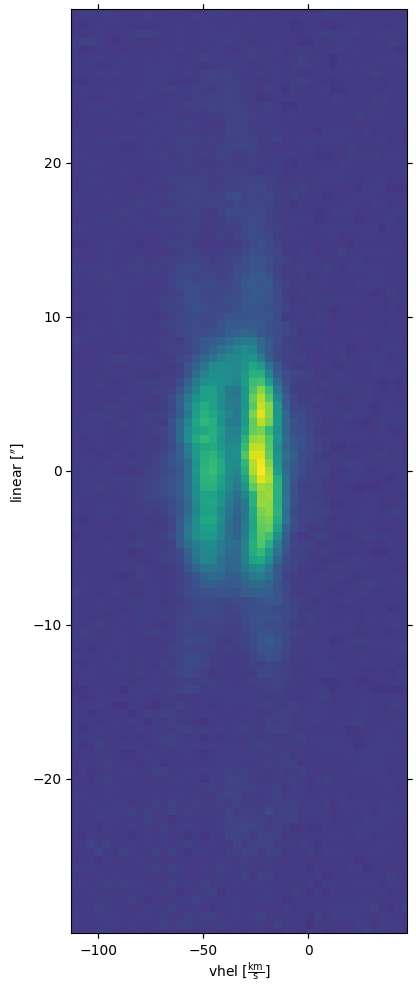

In [28]:
fig, ax = plt.subplots(
    figsize=(5, 12),
    subplot_kw=dict(projection=w)
)

vsys = -33
v1, v2 = vsys - 80, vsys + 80
s1, s2 = -30, 30
xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])

y1, y2 = [int(_) for _ in ylims]
bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
im = hdu.data - 0.5 * (bg1 + bg2)
ax.imshow(im)
ax.set(
    xlim=xlims,
    ylim=ylims,
)

## Look at all the [O III] slits

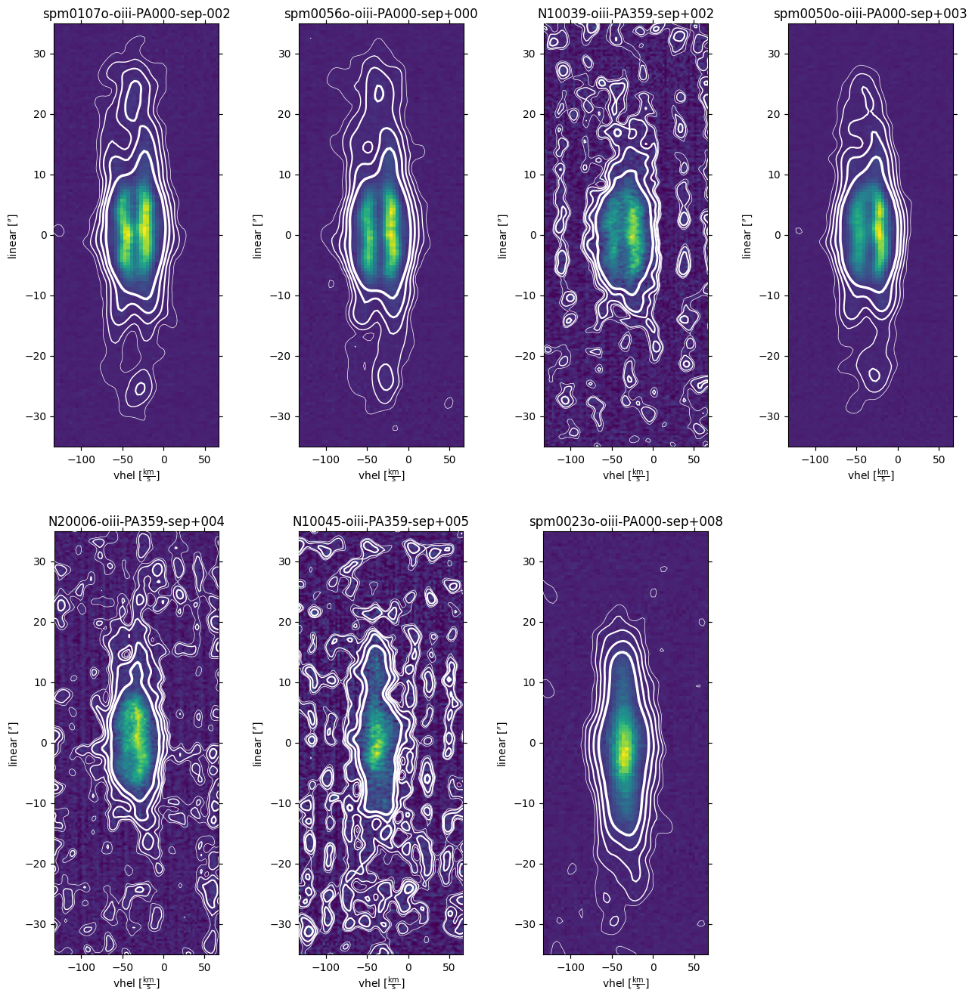

In [29]:
file_list = sorted(pvpath.glob("*-oiii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
    bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

Regrid all the oiii slits and save to files

In [30]:
pvpath2 = pvpath.parent / "pv-common"
pvpath2.mkdir(exist_ok=True)

In [31]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    # Use output pixels of 2 km/s by 1 arcsec
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

Take a look at the new regridded PV spectra

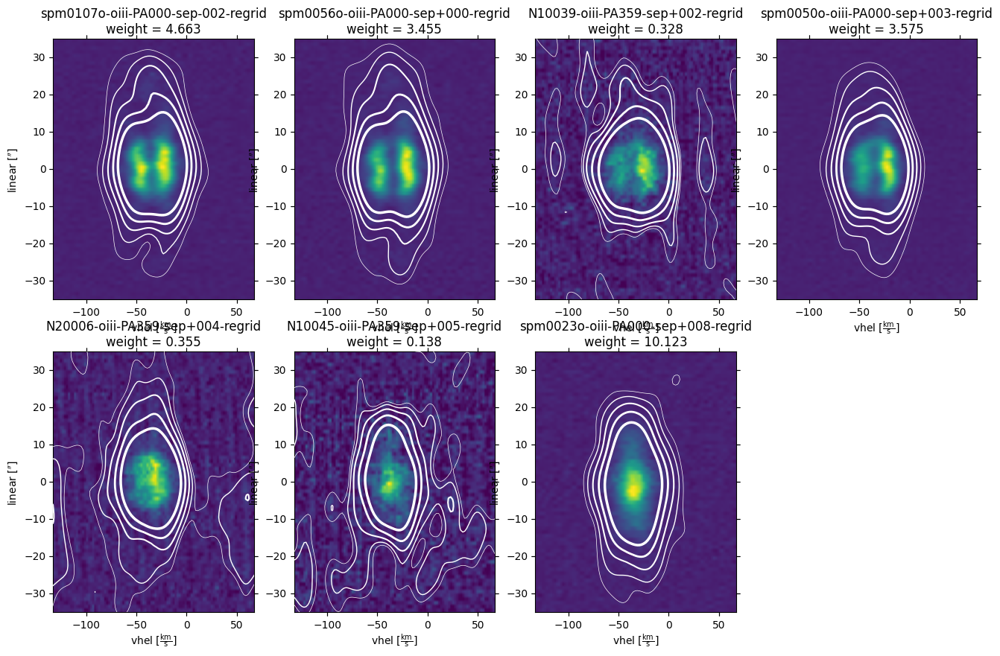

In [32]:
file_list = sorted(pvpath2.glob("*-oiii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 5 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1+10], axis=0)
    bg2 = np.median(hdu.data[y2-10:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
...;

This looks good, except for the noise, which has gone a bit weird.  Now we choose the best spectra tho combine. 

Looks like first 4

In [33]:
selected = 0, 1, 2, 3
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "oiii-pv-coadd.fits", overwrite=True)




## Repeat for all the Ha slits

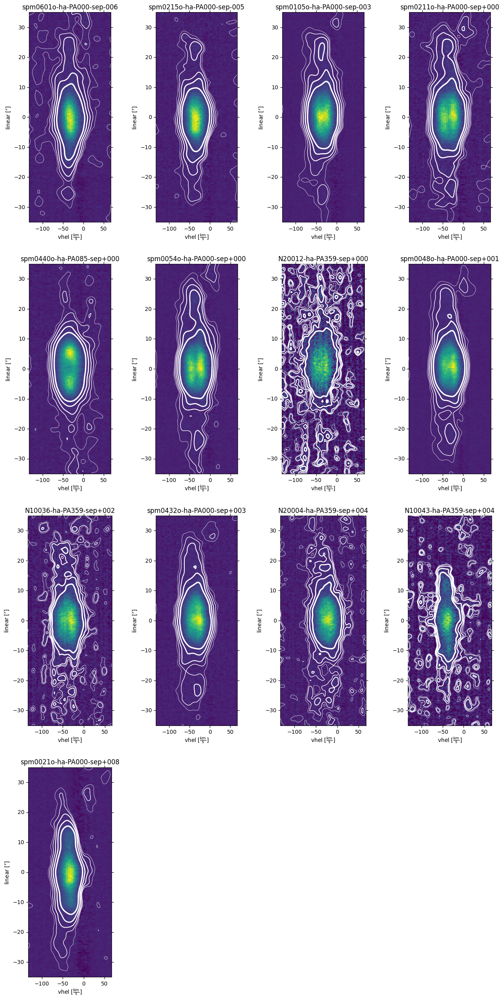

In [34]:
file_list = sorted(pvpath.glob("*-ha-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

### Minor axis spatial profile

Fit gaussian to profile along horizontal slit

In [35]:
w

WCS Keywords

Number of WCS axes: 2
CTYPE : 'VHEL' 'LINEAR' 
CRVAL : -213.61070165716 0.0 
CRPIX : 1.0 478.0 
PC1_1 PC1_2  : 1.0 0.0 
PC2_1 PC2_2  : 0.0 1.0 
CDELT : 3.7737766714679 0.52645149331988 
NAXIS : 121  657

In [36]:
filepath = file_list[4]
hdu, = fits.open(filepath)
w = WCS(hdu.header)
ny, nx = hdu.data.shape
_, yy = w.array_index_to_world(np.arange(ny), [0] * ny)
yy

<Quantity [-237.24769372, -236.72164562, -236.19559751, -235.66954941,
           -235.14350131, -234.61745321, -234.09140511, -233.56535701,
           -233.03930891, -232.51326081, -231.9872127 , -231.4611646 ,
           -230.9351165 , -230.4090684 , -229.8830203 , -229.3569722 ,
           -228.8309241 , -228.30487599, -227.77882789, -227.25277979,
           -226.72673169, -226.20068359, -225.67463549, -225.14858739,
           -224.62253928, -224.09649118, -223.57044308, -223.04439498,
           -222.51834688, -221.99229878, -221.46625068, -220.94020258,
           -220.41415447, -219.88810637, -219.36205827, -218.83601017,
           -218.30996207, -217.78391397, -217.25786587, -216.73181776,
           -216.20576966, -215.67972156, -215.15367346, -214.62762536,
           -214.10157726, -213.57552916, -213.04948105, -212.52343295,
           -211.99738485, -211.47133675, -210.94528865, -210.41924055,
           -209.89319245, -209.36714435, -208.84109624, -208.31504814,
      

In [37]:
_, [i1, i2] = w.world_to_array_index_values([-70, 0], [0, 0])
i1, i2, _

(42, 60, array([451, 451]))

In [38]:
from astropy.modeling import models, fitting

(25.0, -25.0)

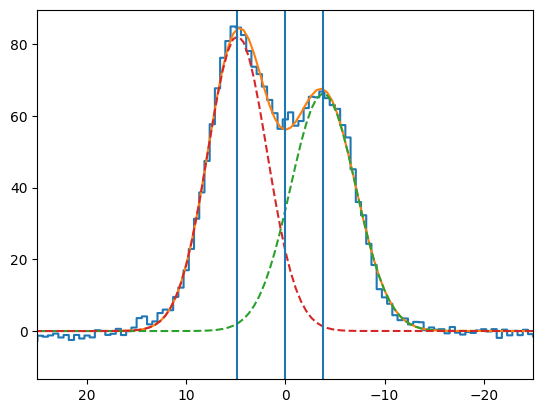

In [39]:
fig, ax = plt.subplots()
profile = np.mean(hdu.data[:, i1:i2], axis=1)
profile -= np.median(profile)
g1 = models.Gaussian1D(amplitude=50, mean=-4, stddev=4)
g2 = models.Gaussian1D(amplitude=70, mean=5, stddev=4)
init_model = g1 + g2
mask = np.abs(yy) < 25 * u.arcsec
fitter = fitting.LevMarLSQFitter()
fitted_model = fitter(init_model, yy[mask], profile[mask])
gg1, gg2 = fitted_model
ax.plot(yy, profile, ds="steps-mid")
ax.plot(yy, fitted_model(yy))
ax.plot(yy, gg1(yy), ls="dashed")
ax.plot(yy, gg2(yy), ls="dashed")

ax.axvline(0)
ax.axvline(gg1.mean.value)
ax.axvline(gg2.mean.value)

ax.set_xlim(25, -25)

Calculate offset between the two peaks:

In [40]:
gg2.mean - gg1.mean

<Quantity 8.64540943 arcsec>

In [41]:
gg1.mean, gg2.mean

(Parameter('mean', value=-3.8179762928690746, unit=arcsec),
 Parameter('mean', value=4.827433139053187, unit=arcsec))

Width of peaks

In [42]:
gg1.fwhm, gg2.fwhm

(<Quantity 7.75231249 arcsec>, <Quantity 7.03868149 arcsec>)

In [43]:
gg1.stddev

Parameter('stddev', value=3.292104001536758, unit=arcsec, bounds=(1.1754943508222875e-38, None))

#### Fit with thick shell

In [44]:
def shell_bright(x, r, h, f = 0):
    """Projected brightness of cylindrical hollow shell
    
    Parameters:

    x : array of projected positions perpendicular to cylindrical axis
    r : shell outer radius
    h : shell relative thickness
    f : asymmetry
    """
    # line of sight depth through cylinder
    z_out = np.where(
        x**2 <= r**2,
        np.sqrt(r**2 - x**2),
        0.0
    )
    # radius of inner hole
    r_in = r * (1 - h)
    # line of sight depth through inner hole
    z_in = np.where(
        x**2 <= r_in**2,
        np.sqrt(r_in**2 - x**2),
        0.0
    )
    # emissivity is linear function of x for simplicity
    e = np.where(
        x**2 <= r**2,
        1 + f * x / (2 * r),
        0.0,
    )
    return e * (z_out - z_in)

/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_37780/3405454590.py:14: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(r**2 - x**2),
/var/folders/0q/3pcjvc3n6sn2wk6g8ck6ry300000gn/T/ipykernel_37780/3405454590.py:22: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(r_in**2 - x**2),


(25.0, -25.0)

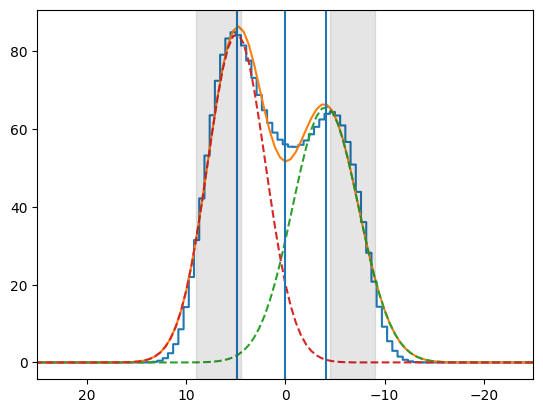

In [45]:
fig, ax = plt.subplots()
rshell, hshell = 9, 0.5
sprofile = 12 * shell_bright(yy.value, rshell, hshell, f=0.5)
kernel = Gaussian1DKernel(stddev=3)
sprofile = convolve_fft(sprofile, kernel)

sg1 = models.Gaussian1D(amplitude=50, mean=-4, stddev=4)
sg2 = models.Gaussian1D(amplitude=70, mean=5, stddev=4)
init_model = sg1 + sg2
mask = np.abs(yy) < 25 * u.arcsec
sfitted_model = fitter(init_model, yy[mask], sprofile[mask])
sgg1, sgg2 = sfitted_model
ax.plot(yy, sprofile, ds="steps-mid")
ax.plot(yy, sfitted_model(yy))
ax.plot(yy, sgg1(yy), ls="dashed")
ax.plot(yy, sgg2(yy), ls="dashed")

ax.axvline(0)
ax.axvline(sgg1.mean.value)
ax.axvline(sgg2.mean.value)

ax.axvspan(hshell * rshell, rshell, alpha=0.1, color="k", zorder=100)
ax.axvspan(-hshell * rshell, -rshell, alpha=0.1, color="k", zorder=100)
ax.set_xlim(25, -25)

In [46]:
sgg2.mean - sgg1.mean

<Quantity 8.97337355 arcsec>

In [47]:
sgg1.mean, sgg2.mean

(Parameter('mean', value=-4.05604657570592, unit=arcsec),
 Parameter('mean', value=4.9173269764172005, unit=arcsec))

In [48]:
sgg1.fwhm, sgg2.fwhm

(<Quantity 7.86259937 arcsec>, <Quantity 6.85257398 arcsec>)

In [49]:
hshell * rshell / np.mean([sgg1.fwhm.value, sgg2.fwhm.value])

0.6116135898826153

In [50]:
hshell * rshell / sgg2.fwhm.value

0.6566875475734412

In [51]:
2 * (1 - hshell) * rshell / (sgg2.mean - sgg1.mean).value

1.0029672728681376

So we find that the peak-peak distance is equal to the *inner* diameter of the shell. 

Whereas the shell thickness is about 0.6 times FWHM. 

Conclusions, the inner lobes have larger diameter than I thought. 

Inner radius 4.3. Thickness 4.5 arcsec, so outer radius about 9 arcsec. 

If we take half-way point, we have 6.8 +/- 2.2 arcsec. 

We also reproduce the asymmetry in the peak positions with a simple linear gradient for the emissivity. The weaker side is displaced inward by about 10% and the stronger side displaced outward by the same amount

#### Fit with power-law shell

In [52]:
from scipy import integrate
def shell_bright_powerlaw(x, r_in, a=4, f=0):
    """Projected brightness of cylindrical hollow shell
    
    Parameters:

    x : array of projected positions perpendicular to cylindrical axis
    r_in : shell inner radius
    a : power-law index for emissivity
    f : asymmetry
    """

    # emissivity is power law in radius
    rgrid = np.geomspace(r_in, 10 * r_in, 200)
    egrid = (rgrid/r_in) ** -a

    # integrate to get surface brightness
    bgrid, sbgrid = brightness_discrete(rgrid, egrid)

    # double up grid to include pos and neg sides
    bb = np.concatenate([-bgrid[::-1], bgrid])
    sbb = np.concatenate([sbgrid[::-1], sbgrid])

    # interpolate onto requested grid
    e = np.interp(x, bb, sbb)
    print(e.shape, x.shape)
    # add in a linear asymmetry
    e = e * (1 + f * x / (2 * r_in))
    return e

    
    
    
def brightness_discrete(r, e, n_inner=50, verbose=False, integrator=np.trapz):
    """Perform integral of surface brightness along line of sight

    Suitable values for `integrator` are numpy.trapz or scipy.integrate.simpson
    """

    # Use the Cloudy radial points with additional uniform grid from origin to inner boundary
    b_inner = np.linspace(0.0, r.min(), num=n_inner, endpoint=False)
    b = np.concatenate((b_inner, r))
    
    sb = np.zeros_like(b)
    # For each impact parameter
    for i, _b in enumerate(b):
        # Select all radii greater than impact parameter
        m = r >= _b
        # Array of LOS positions for each of these radii
        z = np.sqrt(r[m]**2 - _b**2)
        _e = e[m]
        # Integrate along z to find brightness
        sb[i] = 2 * integrator(_e, z)
    return b, sb

(603,) (603,)


(25.0, -25.0)

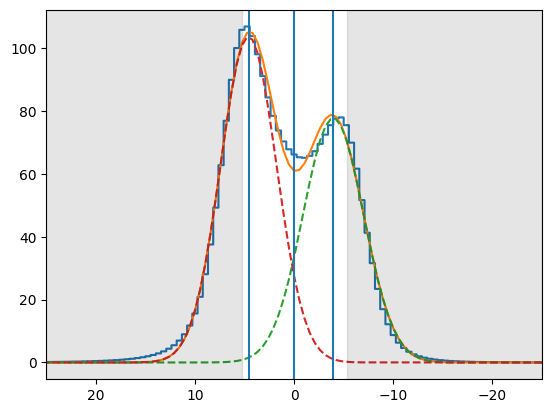

In [53]:
fig, ax = plt.subplots()
r_in = 5.3
s6profile = 30 * shell_bright_powerlaw(yy.value, r_in, a=6, f=0.35)
kernel = Gaussian1DKernel(stddev=3)
s6profile = convolve_fft(s6profile, kernel)

sg1 = models.Gaussian1D(amplitude=50, mean=-4, stddev=4)
sg2 = models.Gaussian1D(amplitude=70, mean=5, stddev=4)
init_model = sg1 + sg2
mask = np.abs(yy) < 25 * u.arcsec
sfitted_model = fitter(init_model, yy[mask], s6profile[mask])
sgg1, sgg2 = sfitted_model
ax.plot(yy, s6profile, ds="steps-mid")
ax.plot(yy, sfitted_model(yy))
ax.plot(yy, sgg1(yy), ls="dashed")
ax.plot(yy, sgg2(yy), ls="dashed")

ax.axvline(0)
ax.axvline(sgg1.mean.value)
ax.axvline(sgg2.mean.value)

ax.axvspan(r_in, 25, alpha=0.1, color="k", zorder=100)
ax.axvspan(-25, -r_in, alpha=0.1, color="k", zorder=100)
ax.set_xlim(25, -25)

In [54]:
sgg2.mean - sgg1.mean

<Quantity 8.54647778 arcsec>

In [55]:
sgg1.mean, sgg2.mean

(Parameter('mean', value=-3.9547150553574326, unit=arcsec),
 Parameter('mean', value=4.591762726466337, unit=arcsec))

In [56]:
sgg1.fwhm, sgg2.fwhm

(<Quantity 7.18179888 arcsec>, <Quantity 6.63426831 arcsec>)

(603,) (603,)


(25.0, -25.0)

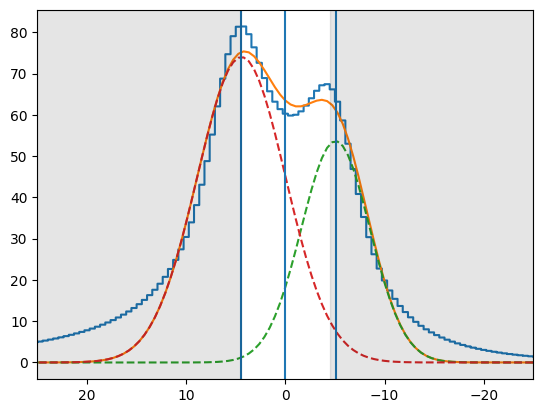

In [57]:
fig, ax = plt.subplots()
r_in = 4.5
s3profile = 13 * shell_bright_powerlaw(yy.value, r_in, a=3, f=0.2)
kernel = Gaussian1DKernel(stddev=3)
s3profile = convolve_fft(s3profile, kernel)

sg1 = models.Gaussian1D(amplitude=50, mean=-4, stddev=2)
sg2 = models.Gaussian1D(amplitude=70, mean=5, stddev=2)
init_model = sg1 + sg2
mask = np.abs(yy) < 15 * u.arcsec
sfitted_model = fitter(init_model, yy[mask], s3profile[mask])
sgg1, sgg2 = sfitted_model
ax.plot(yy, s3profile, ds="steps-mid")
ax.plot(yy, sfitted_model(yy))
ax.plot(yy, sgg1(yy), ls="dashed")
ax.plot(yy, sgg2(yy), ls="dashed")

ax.axvline(0)
ax.axvline(sgg1.mean.value)
ax.axvline(sgg2.mean.value)

ax.axvspan(r_in, 25, alpha=0.1, color="k", zorder=100)
ax.axvspan(-25, -r_in, alpha=0.1, color="k", zorder=100)
ax.set_xlim(25, -25)

In [58]:
sgg2.mean - sgg1.mean

<Quantity 9.49338042 arcsec>

In [59]:
sgg1.mean, sgg2.mean

(Parameter('mean', value=-5.063878630861916, unit=arcsec),
 Parameter('mean', value=4.429501789862079, unit=arcsec))

In [60]:
sgg1.fwhm, sgg2.fwhm

(<Quantity 8.1293496 arcsec>, <Quantity 10.49920896 arcsec>)

So the power law model with a=6 does work ok

#### Summary of minor axis results

Both the thick shell and the steep power law work tolerably well at fitting the profile along the horizontal slit.

(25.0, -25.0)

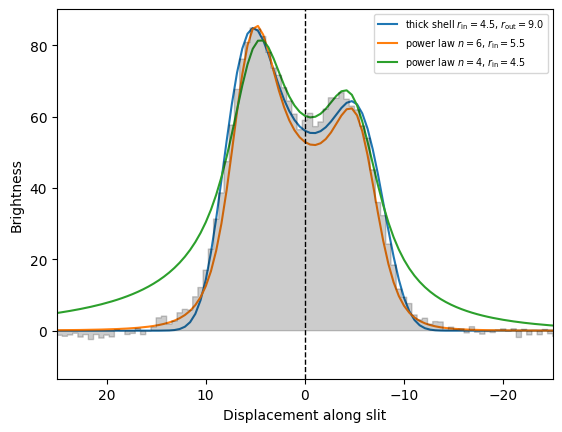

In [61]:
fig, ax = plt.subplots()

ax.fill_between(yy.value, profile, step="mid", alpha=0.2, color="k", zorder=100)
ax.plot(yy, sprofile, label=r"thick shell $r_\mathrm{in} = 4.5$, $r_\mathrm{out} = 9.0$")
ax.plot(yy, 0.8 * s6profile, label=r"power law $n = 6$, $r_\mathrm{in} = 5.5$")
ax.plot(yy, s3profile, label=r"power law $n = 4$, $r_\mathrm{in} = 4.5$")

ax.axvline(0, ls="dashed", color="k", lw=1)
# ax.axvline(gg1.mean.value)
# ax.axvline(gg2.mean.value)
ax.set_xlabel("Displacement along slit")
ax.set_ylabel("Brightness")
ax.legend(fontsize="x-small")
ax.set_xlim(25, -25)

### Regrid the Ha spectra

In [62]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

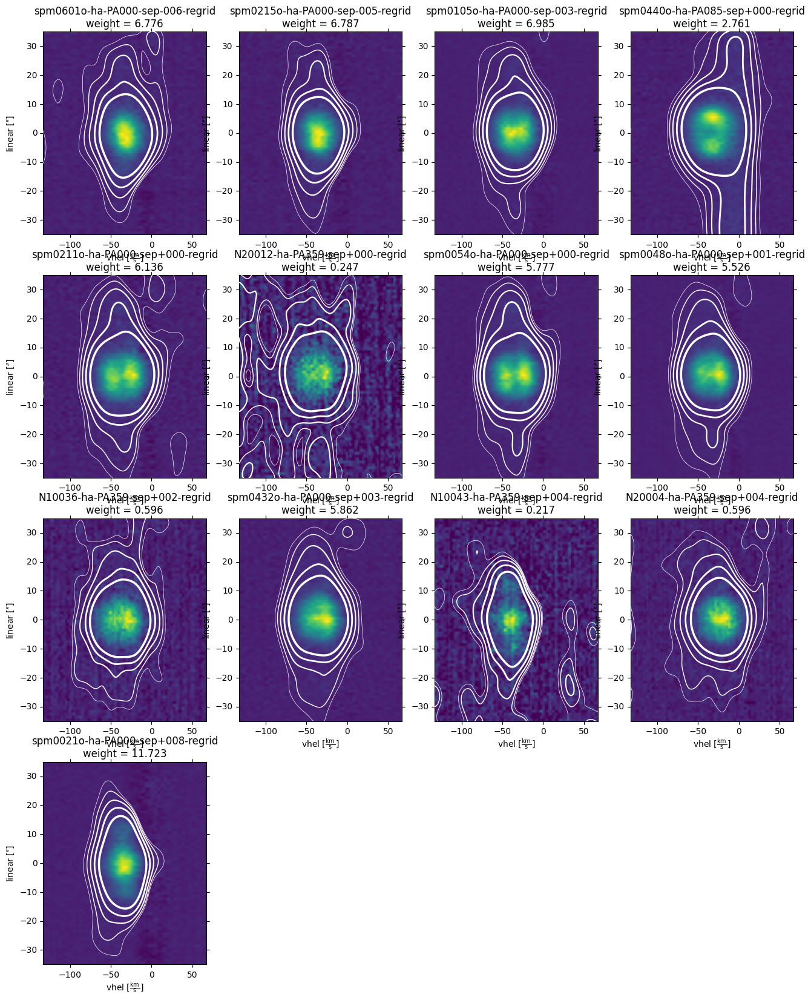

In [63]:
file_list = sorted(pvpath2.glob("*-ha-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 5 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
...;

In [64]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "ha-pv-coadd.fits", overwrite=True)

## Repeat for He II and [N II]

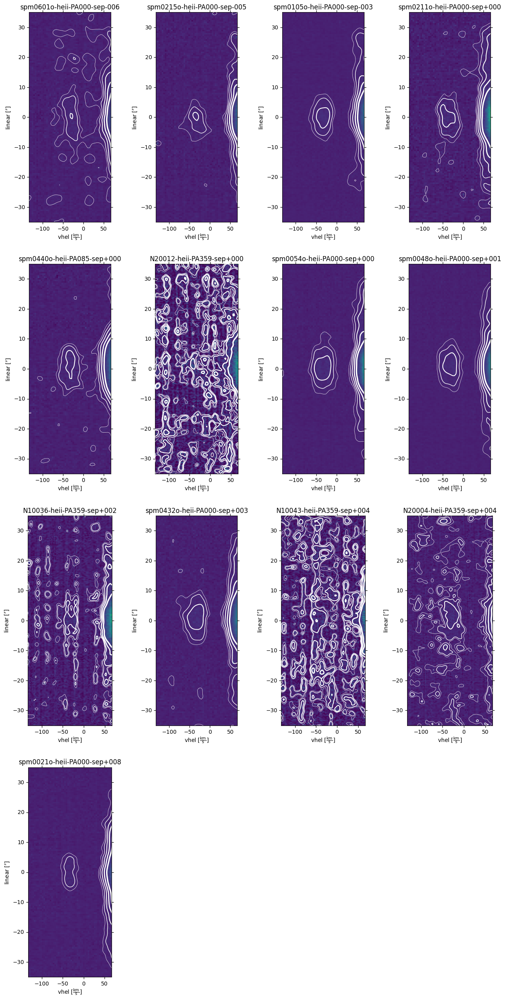

In [65]:
file_list = sorted(pvpath.glob("*-heii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [66]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

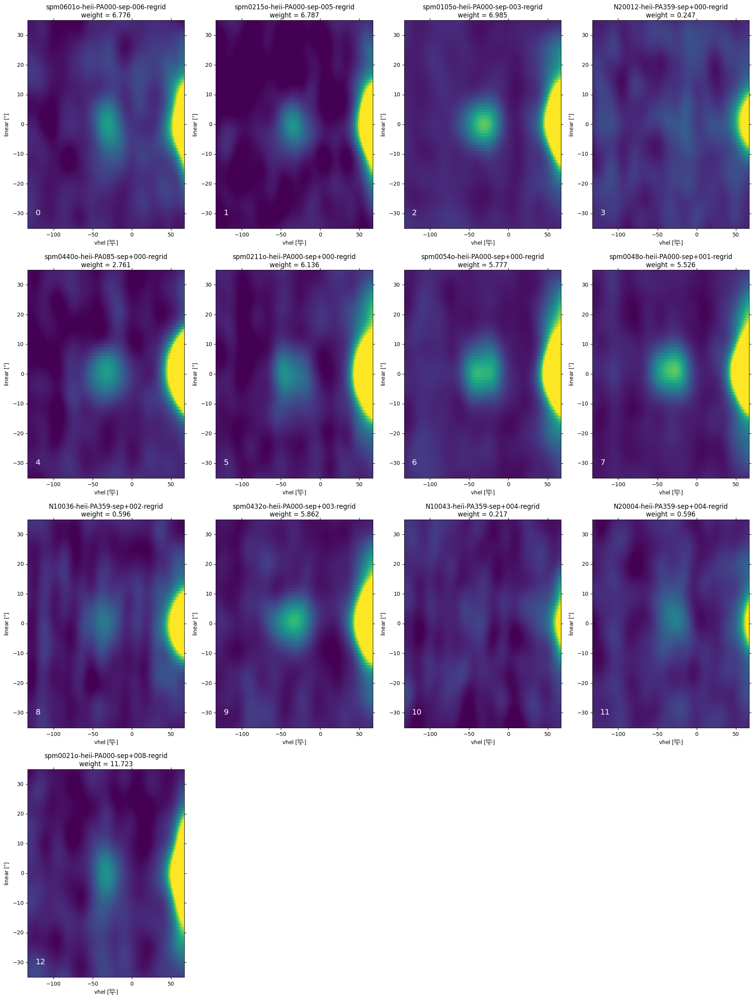

In [67]:
file_list = sorted(pvpath2.glob("*-heii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(6 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99)
    im /= scale
    ims = convolve_fft(im, kernel)
    ax.imshow(ims, vmin=-0.1, vmax=1.0, aspect="auto")
    #ax.contour(
    #    ims, 
    #    levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
    #    colors="w",
    #    linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    #)

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
    ax.text(x1 + 5, y1 + 5, f"{i}", color="w", fontsize="x-large")
...;

In [68]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "heii-pv-coadd.fits", overwrite=True)

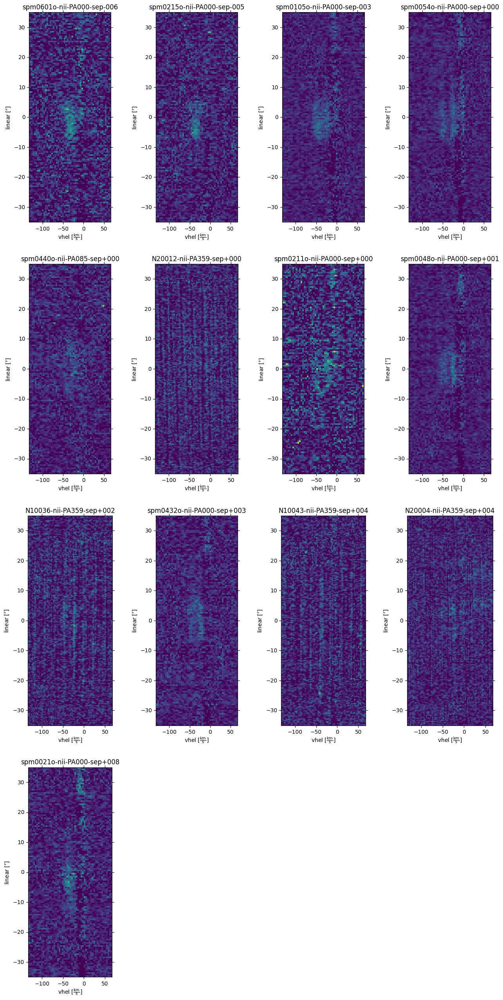

In [69]:
file_list = sorted(pvpath.glob("*-nii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    bg1 = np.median(hdu.data[y1:y1+30], axis=0)
    bg2 = np.median(hdu.data[y2-30:y2], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    im /= im.max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
#    ax.contour(
#        ims, 
#        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
#        colors="w",
#        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
#    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [70]:
for filepath in file_list:
    hdu, = fits.open(filepath)
    hdu2 = mes.regrid_pv(hdu, pixscale=(2.0, 1.0))
    filepath2 = pvpath2 / f"{filepath.stem}-regrid.fits" 
    hdu2.writeto(filepath2, overwrite=True)

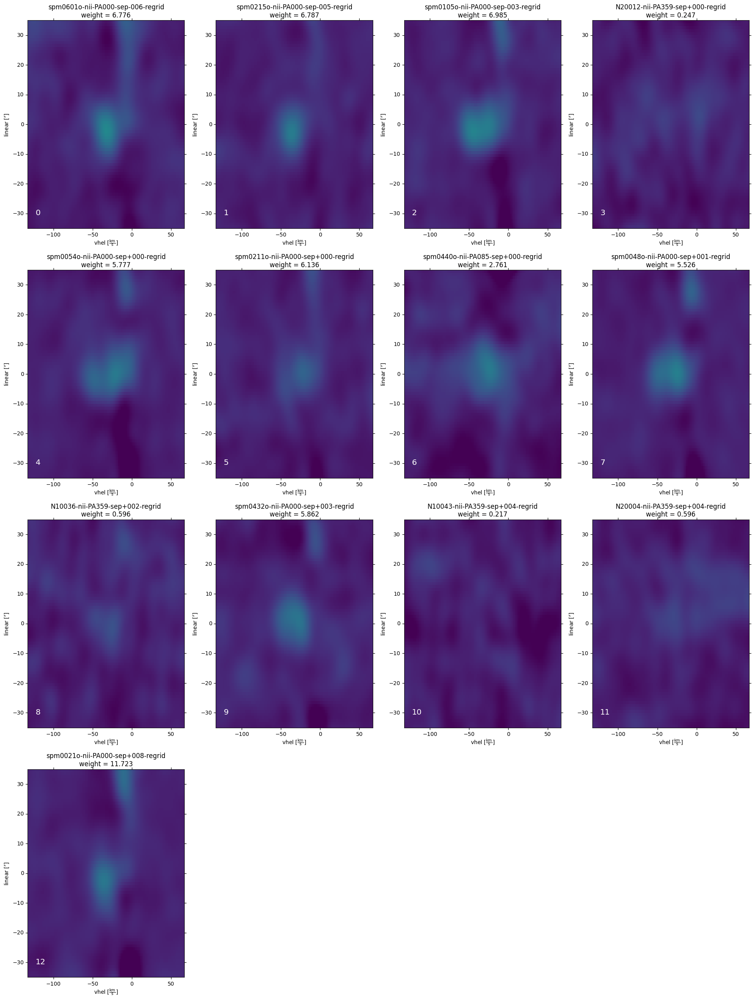

In [71]:
file_list = sorted(pvpath2.glob("*-nii-*.fits"), key=fkey)

N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(6 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=4.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    bg1 = np.median(hdu.data[y1:y1+30], axis=0)
    bg2 = np.median(hdu.data[y2-30:y2], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99.9)
    im /= scale
    ims = convolve_fft(im, kernel)
    ax.imshow(ims, vmin=-0.1, vmax=1.0, aspect="auto")
    #ax.contour(
    #    ims, 
    #    levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
    #    colors="w",
    #    linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    #)

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem + f"\nweight = {hdu.header['WEIGHT']:.3f}")
    ax.text(x1 + 5, y1 + 5, f"{i}", color="w", fontsize="x-large")
...;

In [72]:
selected = 2, 4, 5, 6, 7, 8, 9
imlist = []
weightsum = 0.0

for isel in selected:
    hdu, = fits.open(file_list[isel])
    weight =  hdu.header["WEIGHT"]
    imlist.append(weight * hdu.data)
    weightsum += weight
    
hdu.data = np.sum(np.stack(imlist, axis=0), axis=0) / weightsum
hdu.writeto(pvpath2 / "nii-pv-coadd.fits", overwrite=True)

## Look at our co-added spectra

In [73]:
import seaborn as sns
sns.set_context("talk")

Update this to be more similar to what we do for oiii in the 04-02 notebook. Write the normalized bg-subtracted images first 

In [74]:
file_list = sorted(pvpath2.glob("*-pv-coadd.fits"))

N = len(file_list)

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

contours = "oiii", "ha"
kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    if filepath.stem.startswith("nii"):
        bg1 = np.mean(hdu.data[y1:y1+30], axis=0)
        bg2 = np.mean(hdu.data[y2-30:y2], axis=0)
    else:
        bg1 = np.median(hdu.data[y1-10:y1], axis=0)
        bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99.99)
    im /= scale
    # Save a FITS file of BG-subtracted and normalized image
    fits.PrimaryHDU(
        header=hdu.header,
        data=im,
    ).writeto(
        str(filepath).replace(".fits", "-bgsub.fits"),
        overwrite=True,
    )

And then do the plot separately

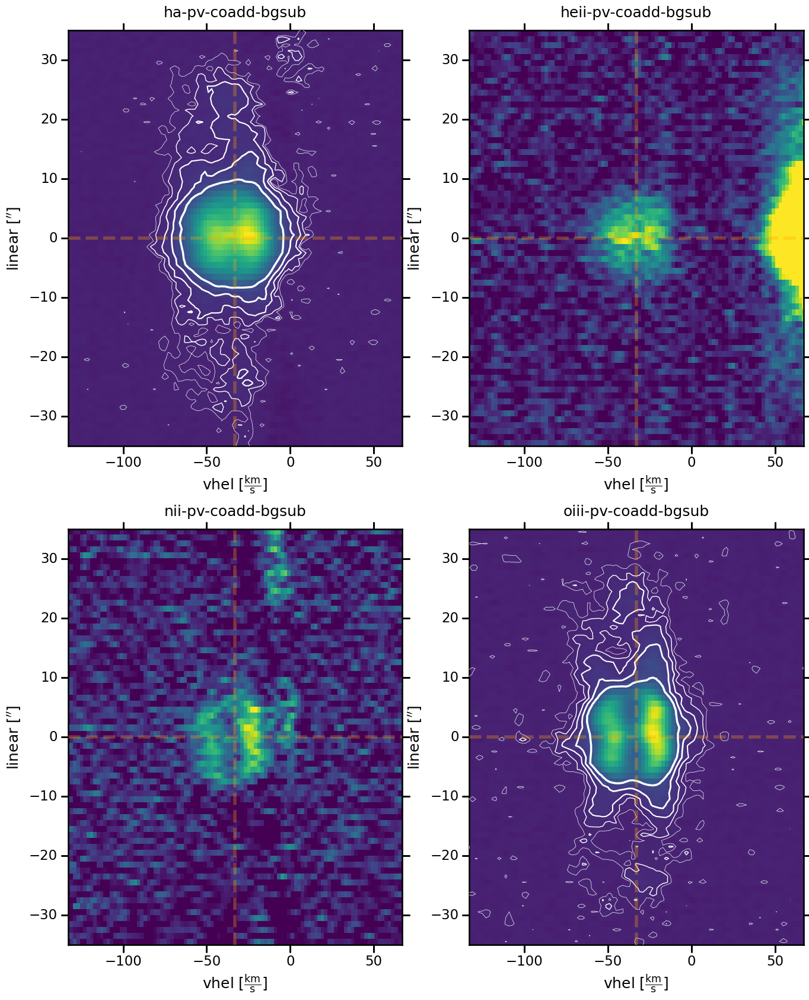

In [75]:
file_list = sorted(pvpath2.glob("*-pv-coadd-bgsub.fits"))

N = len(file_list)
ncols = 2
nrows = (N // ncols)
fig = plt.figure(figsize=(8 * ncols, 10 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

contours = "oiii", "ha"
kernel = Gaussian2DKernel(x_stddev=0.1)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    im = hdu.data
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    # ims = convolve_fft(im, kernel)
    if filepath.stem.startswith(contours):
        ax.contour(
            im, 
            levels=[0.01, 0.02, 0.04, 0.08, 0.16], 
            colors="w",
            linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
        )
    x0, y0 = w.world_to_pixel_values(vsys, 0.0)
    ax.axhline(y0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.axvline(x0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem, pad=16)
figfile = "ou5-coadd-2dspec.pdf"
fig.savefig(figfile)
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

### And do the spatial profiles along the slit

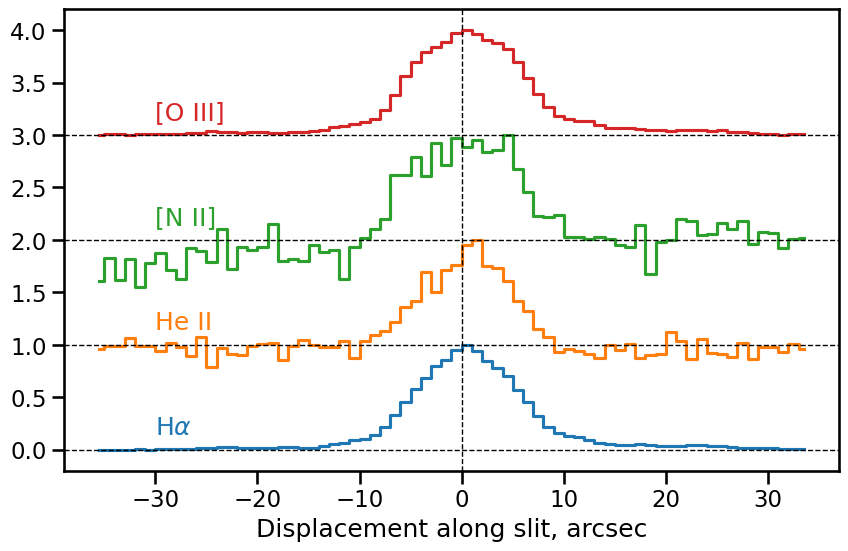

In [76]:
file_list = sorted(pvpath2.glob("*-pv-coadd-bgsub.fits"))

fig, ax = plt.subplots(
    figsize=(10, 6),
)
labels = {
    "oiii": "[O III]",
    "ha": r"H$\alpha$",
    "nii": "[N II]",
    "heii": "He II",
}
vsys = -33
v1, v2 = -75, 10
s1, s2 = -35, 35
offset = 0.0
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    line_label = filepath.stem.split("-")[0]
    im = hdu.data
    w = WCS(hdu.header)
    ns, nv = hdu.data.shape
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile = hdu.data[y1:y2, x1:x2].mean(axis=1)
    _, pos = w.pixel_to_world_values([0]*ns, np.arange(ns))
    pos = pos[y1:y2]
    profile *= 1/ np.max(profile)
    line, = ax.plot(pos, profile + offset, label=line_label, ds="steps-mid")
    ax.text(-30, offset + 0.15, labels[line_label], color=line.get_color())
    ax.axhline(offset, linestyle="dashed", c="k", lw=1,)
    offset += 1
ax.axvline(0.0, linestyle="dashed", c="k", lw=1,)
#ax.legend(ncol=2)
ax.set(
    xlabel="Displacement along slit, arcsec",
)
figfile = "ou5-coadd-spatial-profiles-1d.pdf"
fig.savefig(figfile, bbox_inches="tight")
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

### Summed spectrum of entire inner lobes


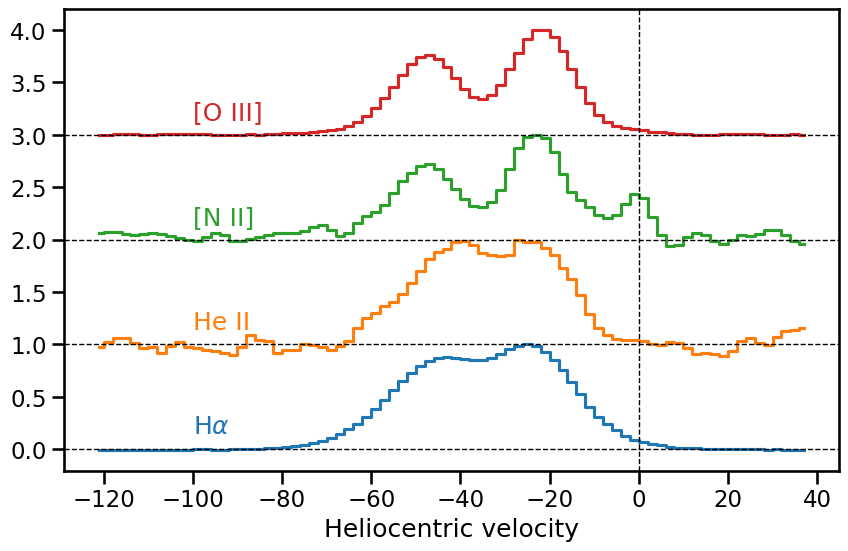

In [77]:
file_list = sorted(pvpath2.glob("*-pv-coadd-bgsub.fits"))

fig, ax = plt.subplots(
    figsize=(10, 6),
)
labels = {
    "oiii": "[O III]",
    "ha": r"H$\alpha$",
    "nii": "[N II]",
    "heii": "He II",
}
vprofiles_all = {}
vsys = -33
v1, v2 = -120, 40
s1, s2 = -6, 6
offset = 0.0
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    line_label = filepath.stem.split("-")[0]
    im = hdu.data
    w = WCS(hdu.header)
    ns, nv = hdu.data.shape
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile = hdu.data[y1:y2, x1:x2].mean(axis=0)
    vels, _ = w.pixel_to_world_values(np.arange(nv), [0]*nv)
    vels = vels[x1:x2]
    profile *= 1/ np.max(profile)
    vprofiles_all[line_label] = profile
    line, = ax.plot(vels, profile + offset, label=line_label, ds="steps-mid")
    ax.text(-100, offset + 0.15, labels[line_label], color=line.get_color())
    ax.axhline(offset, linestyle="dashed", c="k", lw=1,)
    offset += 1
ax.axvline(0.0, linestyle="dashed", c="k", lw=1,)
#ax.legend(ncol=2)
ax.set(
    xlabel="Heliocentric velocity",
)
figfile = "ou5-coadd-velocity-profiles-1d.pdf"
fig.savefig(figfile, bbox_inches="tight")
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

### Summed spectrum for $3.5 < |z| < 8.0$

Repeat but excluding the equatorial plane, in order to avoid the high-velocity wings. 

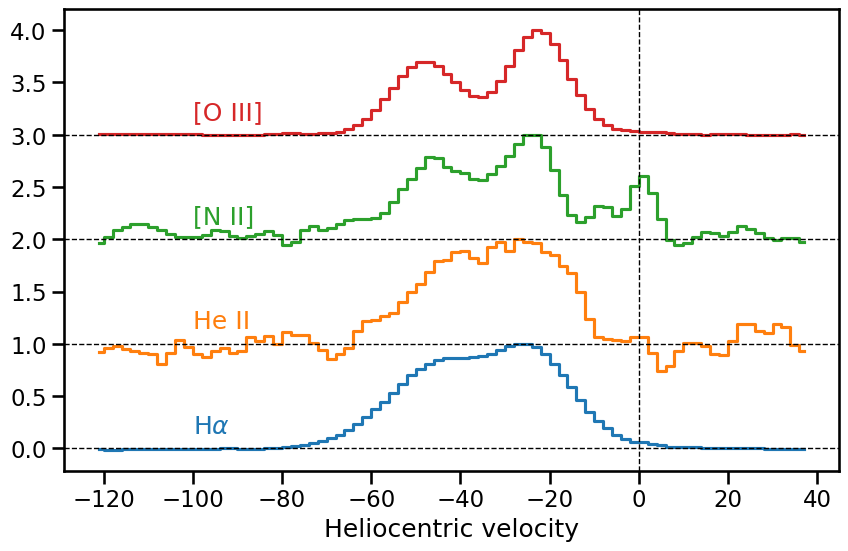

In [78]:
file_list = sorted(pvpath2.glob("*-pv-coadd-bgsub.fits"))

fig, ax = plt.subplots(
    figsize=(10, 6),
)
labels = {
    "oiii": "[O III]",
    "ha": r"H$\alpha$",
    "nii": "[N II]",
    "heii": "He II",
}
vprofiles_ilobes = {}
vsys = -33
v1, v2 = -120, 40
s1, s2 = 3.5, 8
offset = 0.0
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    line_label = filepath.stem.split("-")[0]
    im = hdu.data
    w = WCS(hdu.header)
    ns, nv = hdu.data.shape

    # North lobe
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile = hdu.data[y1:y2, x1:x2].mean(axis=0)

    # South lobe
    xlims, ylims = w.world_to_pixel_values([v1, v2], [-s2, -s1])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile += hdu.data[y1:y2, x1:x2].mean(axis=0)

    vels, _ = w.pixel_to_world_values(np.arange(nv), [0]*nv)
    vels = vels[x1:x2]
    profile *= 1/ np.max(profile)
    vprofiles_ilobes[line_label] = profile
    line, = ax.plot(vels, profile + offset, label=line_label, ds="steps-mid")
    ax.text(-100, offset + 0.15, labels[line_label], color=line.get_color())
    ax.axhline(offset, linestyle="dashed", c="k", lw=1,)
    offset += 1
ax.axvline(0.0, linestyle="dashed", c="k", lw=1,)
#ax.legend(ncol=2)
ax.set(
    xlabel="Heliocentric velocity",
)
figfile = "ou5-coadd-velocity-profiles-1d-avoid-equator.pdf"
fig.savefig(figfile)
fig.savefig(figfile.replace(".pdf", ".jpg"))
...;

### Convolve [O III] with Gaussian to match Ha

In [79]:
from astropy.convolution import convolve, Gaussian1DKernel

Choose whether to excluide equatorial region or not

In [80]:
vprofiles = vprofiles_all
#vprofiles = vprofiles_ilobes

Small correction to the [O III] zero level

In [81]:
vprofiles["oiii"] -= 0.01

Shift the Ha profile to match the mean velocities

In [82]:
vmean_h = np.average(vels, weights=vprofiles["ha"])
vmean_o = np.average(vels, weights=vprofiles["oiii"])
vmean_h, vmean_o

(-34.29776760786856, -33.15156646648599)

In [83]:
vshift = vmean_h - vmean_o
vshift

-1.1462011413825692

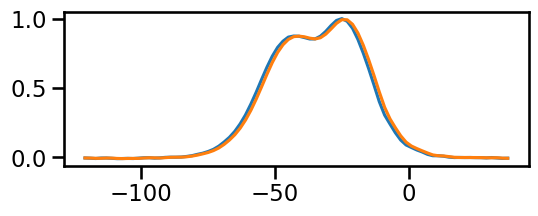

In [84]:
shifted = np.interp(vels + vshift, vels, vprofiles["ha"])
fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(vels, vprofiles["ha"])
ax.plot(vels, shifted)

That seems to have worked correctly by shifting it to the right.

In [85]:
vprofiles["ha"] = shifted

Ensure that total flux is same for [O III] and Ha

In [86]:
boost = np.sum(vprofiles["ha"]) / np.sum(vprofiles["oiii"])
vprofiles["oiii"] *= boost
boost

1.376858918053086

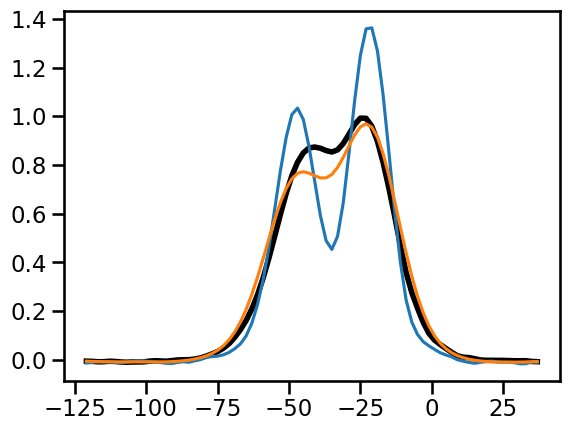

In [87]:
fig, ax = plt.subplots()

ax.plot(vels, vprofiles["ha"], lw=4, color="k")
ax.plot(vels, vprofiles["oiii"])

sprofile = convolve(vprofiles["oiii"], Gaussian1DKernel(stddev=3.8))
ax.plot(vels, sprofile)


In [88]:
sprofile.sum() / np.sum(vprofiles["ha"])

1.0015059202826366

In [89]:
dv = np.diff(vels)[0]

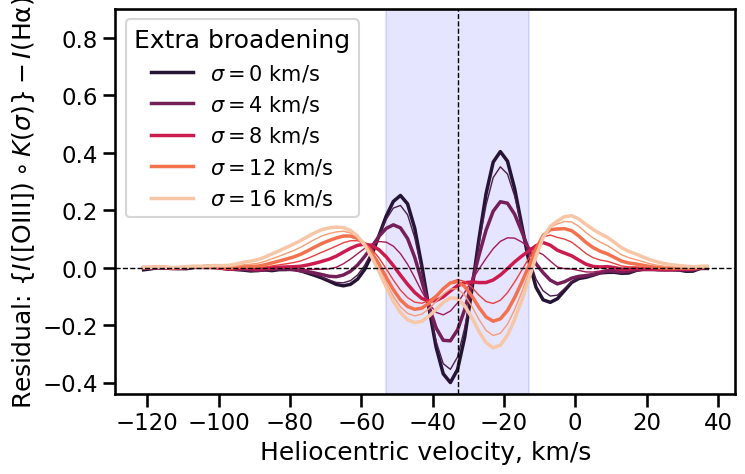

In [90]:
ss_list = np.linspace(0.0, 8.0, 25)
skip = 3
with sns.color_palette("rocket", 1 + len(ss_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    for index, ss in enumerate(ss_list):
        if ss > 0:
            sprofile = convolve(vprofiles["oiii"], Gaussian1DKernel(stddev=ss, mode="oversample"))
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\sigma = {dv * ss:.0f}$ km/s"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Extra broadening")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(r"Residual: $ \left\{ I(\mathrm{[O III]}) \circ K(\sigma) \right\} - I(\mathrm{H\alpha})$")
    figfile = "pn-ou5-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

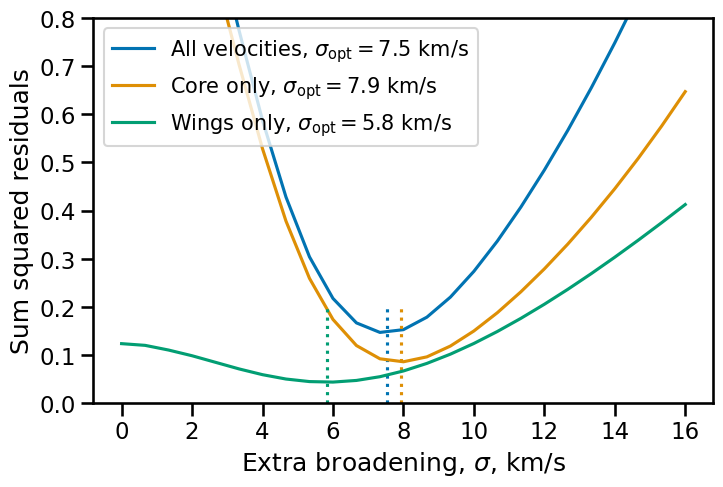

In [91]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    ss_opt = np.interp(0.0, np.gradient(sum_square_residuals), ss_list)
    label = f"All velocities, $\sigma_\mathrm{{opt}} = {dv * ss_opt:.1f}$ km/s"
    line, = ax.plot(dv * ss_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(ss_opt * dv, linestyle="dotted", color=c, ymax=0.25)
    
    ss_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), ss_list)
    label = f"Core only, $\sigma_\mathrm{{opt}} = {dv * ss_opt_core:.1f}$ km/s"
    line, = ax.plot(dv * ss_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(ss_opt_core * dv, linestyle="dotted", color=c, ymax=0.25)

    ss_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), ss_list)
    label = f"Wings only, $\sigma_\mathrm{{opt}} = {dv * ss_opt_wings:.1f}$ km/s"
    line, = ax.plot(dv * ss_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(ss_opt_wings * dv, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Extra broadening, $\sigma$, km/s")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small")
    figfile = "pn-ou5-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

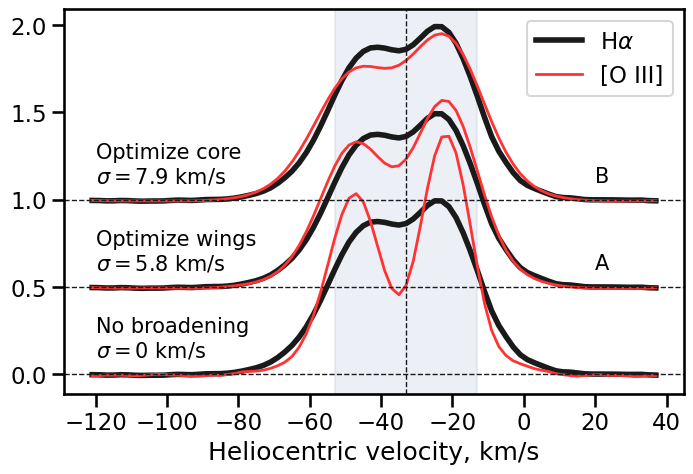

In [92]:
sns.set_color_codes()
with sns.color_palette("dark"):

    fig, ax = plt.subplots(figsize=(8, 5))
    ds = "default"
    #ds = "steps-mid"
    olw, hlw = 2, 4
    ocolor = (1, 0.2, 0.2)
    offset_step = 0.5
    offset = 0
    ax.plot(vels, offset + vprofiles["ha"], lw=hlw, color="k", ds=ds, label=r"H$\alpha$")
    ax.plot(vels, offset + vprofiles["oiii"], color=ocolor, lw=olw, ds=ds, label="[O III]")
    text = "No broadening\n" + r"$\sigma = 0$ km/s"
    ax.text(-120, offset + 0.1, text, fontsize="small")
    ax.axhline(offset, ls="dashed", color="k", lw=1)

    offset += offset_step
    sprofile = convolve(vprofiles["oiii"], Gaussian1DKernel(stddev=ss_opt_wings, mode="oversample"))
    ax.plot(vels, offset + vprofiles["ha"], lw=hlw, color="k")
    ax.plot(vels, offset + sprofile, color=ocolor, lw=olw)
    text = "Optimize wings\n" + rf"$\sigma = {ss_opt_wings * dv:.1f}$ km/s"
    ax.text(-120, offset + 0.1, text, fontsize="small")
    ax.text(20, offset + 0.1, "A", fontsize="small")
    ax.axhline(offset, ls="dashed", color="k", lw=1)
    
    offset += offset_step
    sprofile = convolve(vprofiles["oiii"], Gaussian1DKernel(stddev=ss_opt_core, mode="oversample"))
    ax.plot(vels, offset + vprofiles["ha"], lw=hlw, color="k")
    ax.plot(vels, offset + sprofile, color=ocolor, lw=olw)
    text = "Optimize core\n" + rf"$\sigma = {ss_opt_core * dv:.1f}$ km/s"
    ax.text(-120, offset + 0.1, text, fontsize="small")
    ax.text(20, offset + 0.1, "B", fontsize="small")
    ax.axhline(offset, ls="dashed", color="k", lw=1)

    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.legend()
    
    figfile = "pn-ou5-convolution-fits.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [93]:
T4_opt = ((ss_opt * dv)**2 - 10.233) / 77.34
T4_opt_core = ((ss_opt_core * dv)**2 - 10.233) / 77.34
T4_opt_wings = ((ss_opt_wings * dv)**2 - 10.233) / 77.34

T4_opt_wings, T4_opt, T4_opt_core

(0.3052862692884387, 0.602390068557594, 0.6805272041434917)

So this gives $T = 6000_{-3000}^{+600}$ K

# Look at the 70 micron slit

This has higher spectral resolution. And we have one position around +5 arcsec, which hits the tangent point of the inner shell, where the expansion broadening should be minimised

## Subtract the background ISM line 

In [171]:

file_dict = {
    "oiii": "N10045-oiii-PA359-sep+005-regrid.fits",
    "ha": "N10043-ha-PA359-sep+004-regrid.fits",
    "heii": "N10043-heii-PA359-sep+004-regrid.fits",
    "nii": "N10043-nii-PA359-sep+004-regrid.fits",
}

N = len(file_dict)

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -15, 15

for i, (lineid, filename) in enumerate(file_dict.items()):
    filepath = pvpath2 / filename
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    x0, y0 = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    if filepath.stem.startswith("nii"):
        bg1 = np.mean(hdu.data[y1:y1+30], axis=0)
        bg2 = np.mean(hdu.data[y2-30:y2], axis=0)
    else:
        bg1 = np.median(hdu.data[y1-10:y1], axis=0)
        bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    scale = np.percentile(im[y1:y2, x1:x0], 99.99)
    im /= scale
    # Save a FITS file of BG-subtracted and normalized image
    fits.PrimaryHDU(
        header=hdu.header,
        data=im,
    ).writeto(
        pvpath2 / f"{lineid}-pv-tangent-point-70-bgsub.fits",
        overwrite=True,
    )

## Plot the bg-subtracted PV arrays

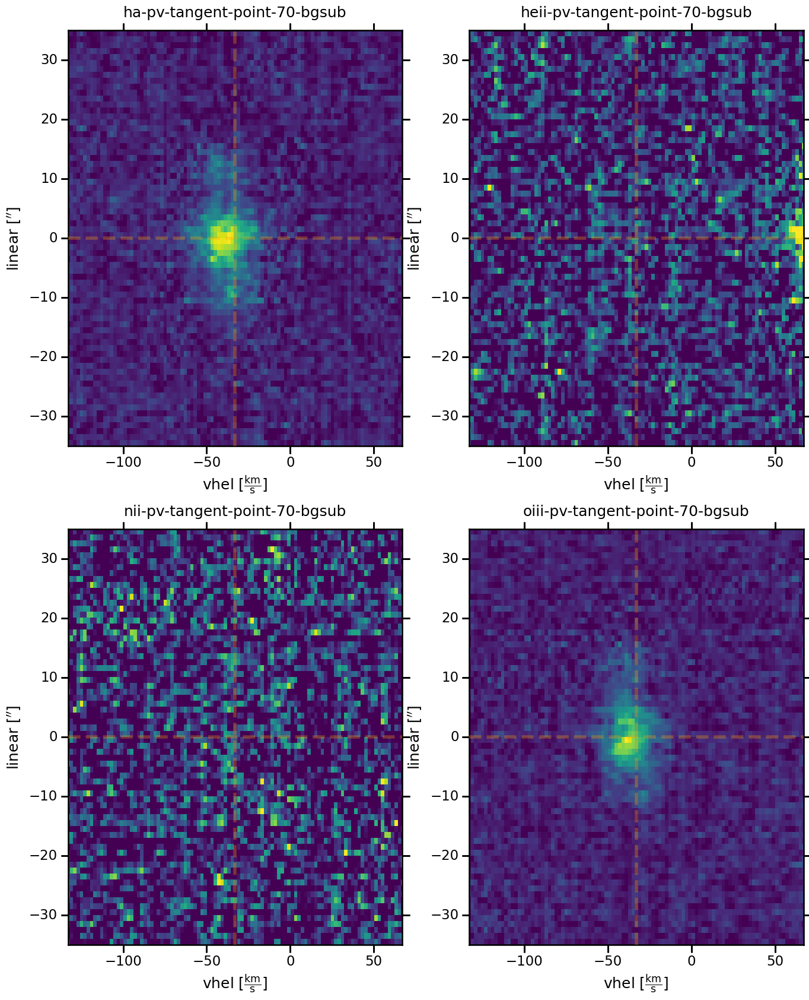

In [172]:
file_list = sorted(pvpath2.glob("*-pv-tangent-*-bgsub.fits"))

N = len(file_list)
ncols = 2
nrows = (N // ncols)
fig = plt.figure(figsize=(8 * ncols, 10 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=0.1)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    im = hdu.data
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    ax.imshow(im, vmin=-0.1, vmax=1.0, aspect="auto")
    x0, y0 = w.world_to_pixel_values(vsys, 0.0)
    ax.axhline(y0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.axvline(x0, color="orange", ls="dashed", lw=4, alpha=0.3)
    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem, pad=16)
figfile = "ou5-tp70-2dspec.pdf"
fig.savefig(figfile)
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

## Summed spectra over equatorial region

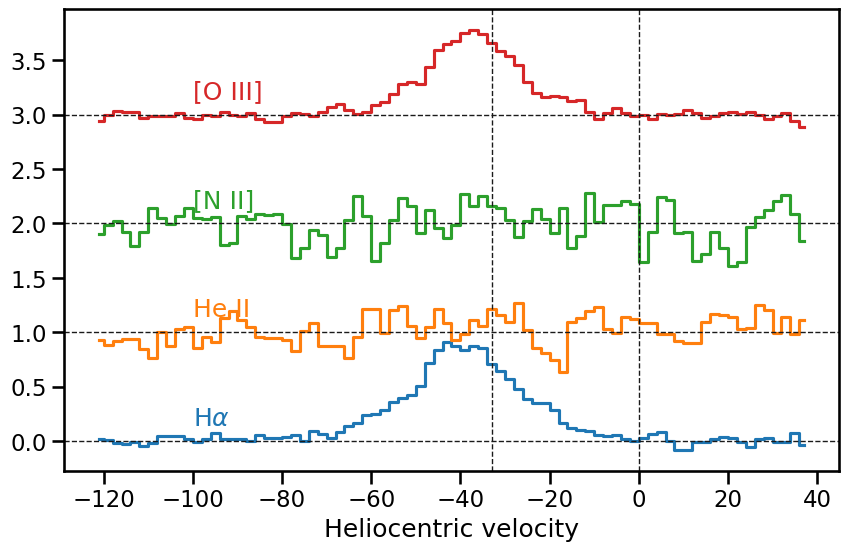

In [192]:
file_list = sorted(pvpath2.glob("*-pv-tangent-*-bgsub.fits"))

fig, ax = plt.subplots(
    figsize=(10, 6),
)
labels = {
    "oiii": "[O III]",
    "ha": r"H$\alpha$",
    "nii": "[N II]",
    "heii": "He II",
}
vprofiles_tp70 = {}
vsys = -33
v1, v2 = -120, 40
s1, s2 = -2.5, 2.5
offset = 0.0
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    line_label = filepath.stem.split("-")[0]
    im = hdu.data
    w = WCS(hdu.header)
    ns, nv = hdu.data.shape
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    x1, x2 = [int(_) for _ in xlims]
    y1, y2 = [int(_) for _ in ylims]
    profile = hdu.data[y1:y2, x1:x2].mean(axis=0)
    vels, _ = w.pixel_to_world_values(np.arange(nv), [0]*nv)
    vels = vels[x1:x2]
    #profile *= 1/ np.max(profile)
    vprofiles_tp70[line_label] = profile
    line, = ax.plot(vels, profile + offset, label=line_label, ds="steps-mid")
    ax.text(-100, offset + 0.15, labels[line_label], color=line.get_color())
    ax.axhline(offset, linestyle="dashed", c="k", lw=1,)
    offset += 1
ax.axvline(0.0, linestyle="dashed", c="k", lw=1,)
ax.axvline(vsys, linestyle="dashed", c="k", lw=1,)
#ax.legend(ncol=2)
ax.set(
    xlabel="Heliocentric velocity",
)
figfile = "ou5-tp70-velocity-profiles-1d.pdf"
fig.savefig(figfile, bbox_inches="tight")
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")
...;

Small correction to the Ha zero level

In [193]:
vprofiles_tp70["ha"] -= 0.02

Shift the Ha profile to match the mean velocities

In [194]:
vmean_h = np.average(vels, weights=vprofiles_tp70["ha"])
vmean_o = np.average(vels, weights=vprofiles_tp70["oiii"])
vmean_h, vmean_o

(-40.190002524851245, -37.25620869731251)

In [195]:
vshift = vmean_h - vmean_o
vshift

-2.933793827538736

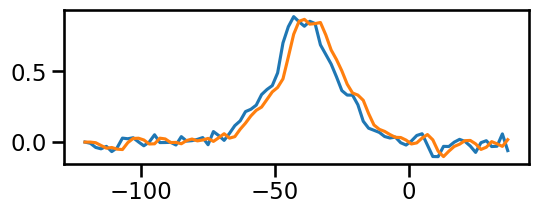

In [196]:
shifted = np.interp(vels + vshift, vels, vprofiles_tp70["ha"])
fig, ax = plt.subplots(figsize=(6, 2))
ax.plot(vels, vprofiles_tp70["ha"])
ax.plot(vels, shifted)

That seems to have worked correctly by shifting it to the right.

In [197]:
vprofiles_tp70["ha"] = shifted

Ensure that total flux is same for [O III] and Ha

In [198]:
boost = np.sum(vprofiles_tp70["ha"]) / np.sum(vprofiles_tp70["oiii"])
vprofiles_tp70["oiii"] *= boost
boost

1.3235954851773852

# Two-phase model

We will now repeat this with the two-phase model from the other notebook, with $\alpha \equiv T_c / T_w = 0.1$ and $\omega \equiv I_c / (I_c + I_w) = 0.5$.

## Data on the fine structure components

In [94]:
from astropy.table import Table

Read the Clegg 1999 data for $n = 100$ pcc

In [95]:
tab = Table.read(Path.cwd().parent / "docs" / "h-case-b-n2.csv")

In [96]:
tab

Index,d lam,d v,300,1000,3000,10000,30000
int64,float64,float64,float64,float64,float64,float64,float64
1,-0.13,-5.93,0.018,0.023,0.031,0.044,0.061
2,0.028,1.27,0.036,0.046,0.061,0.088,0.121
3,-0.11,-5.03,0.057,0.069,0.085,0.106,0.125
4,-0.157,-7.16,0.113,0.138,0.17,0.213,0.25
5,-0.172,-7.85,0.259,0.241,0.218,0.183,0.148
6,-0.014,-0.65,0.052,0.048,0.044,0.037,0.03
7,-0.03,-1.36,0.465,0.435,0.392,0.33,0.266


In [97]:
np.log10(list(map(float, tab.colnames[3:])))

array([2.47712125, 3.        , 3.47712125, 4.        , 4.47712125])

In [98]:
itable = Table(tab.columns[3:])
np.array(itable)

array([(0.018, 0.023, 0.031, 0.044, 0.061),
       (0.036, 0.046, 0.061, 0.088, 0.121),
       (0.057, 0.069, 0.085, 0.106, 0.125),
       (0.113, 0.138, 0.17 , 0.213, 0.25 ),
       (0.259, 0.241, 0.218, 0.183, 0.148),
       (0.052, 0.048, 0.044, 0.037, 0.03 ),
       (0.465, 0.435, 0.392, 0.33 , 0.266)],
      dtype=[('300', '<f8'), ('1000', '<f8'), ('3000', '<f8'), ('10000', '<f8'), ('30000', '<f8')])

In [99]:
np.array(tab["d v"])

array([-5.93,  1.27, -5.03, -7.16, -7.85, -0.65, -1.36])

## Calculate profiles with astropy.modeling


In [100]:
from astropy import constants
from astropy.modeling import models

Normalization for the rms widths

In [101]:
sig0 = np.sqrt( 
    constants.k_B * 10_000 * u.K / constants.m_p 
).to(u.km / u.s)
sig0

<Quantity 9.08537273 km / s>

Fine structure profile for T = 1000 K

In [102]:
vmean_1000 = np.average(tab["d v"], weights=tab["1000"])
sig_1000 = sig0.value * np.sqrt(0.1 * (1 - 1/16))
vmean_1000, sig_1000

(-3.92777, 2.7818159126602695)

In [103]:
comps1000 = [
    models.Gaussian1D(
        amplitude=_amp / sig_1000, 
        mean=_mean - vmean_1000,
        stddev=sig_1000,
    )
    for _mean, _amp in zip(tab["d v"], tab["1000"])
]

In [104]:
kernel1000 = comps1000[0]
for _comp in comps1000[1:]:
    kernel1000 += _comp
kernel1000

<CompoundModel(amplitude_0=0.00826798, mean_0=-2.00223, stddev_0=2.78181591, amplitude_1=0.01653596, mean_1=5.19777, stddev_1=2.78181591, amplitude_2=0.02480394, mean_2=-1.10223, stddev_2=2.78181591, amplitude_3=0.04960788, mean_3=-3.23223, stddev_3=2.78181591, amplitude_4=0.08663406, mean_4=-3.92223, stddev_4=2.78181591, amplitude_5=0.01725492, mean_5=3.27777, stddev_5=2.78181591, amplitude_6=0.15637268, mean_6=2.56777, stddev_6=2.78181591)>

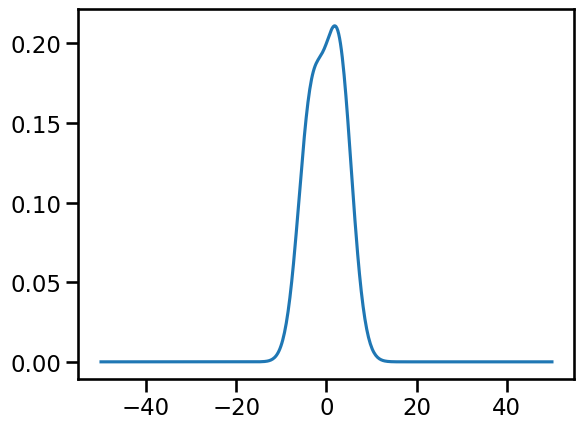

In [105]:
fig, ax = plt.subplots()
finevels = np.linspace(-50, 50, 500)
ax.plot(finevels, kernel1000(finevels))

Fine structure profile for T = 10,000 K

In [106]:
vmean_10000 = np.average(tab["d v"], weights=tab["10000"])
sig_10000 = sig0.value * np.sqrt(1.0 * (1 - 1/16))
vmean_10000, sig_10000

(-4.1127072927072925, 8.796874315306484)

In [107]:
comps10000 = [
    models.Gaussian1D(
        amplitude=_amp / sig_10000, 
        mean=_mean - vmean_10000,
        stddev=sig_10000,
    )
    for _mean, _amp in zip(tab["d v"], tab["10000"])
]

In [108]:
kernel10000 = comps10000[0]
for _comp in comps10000[1:]:
    kernel10000 += _comp
kernel10000

<CompoundModel(amplitude_0=0.00500178, mean_0=-1.81729271, stddev_0=8.79687432, amplitude_1=0.01000355, mean_1=5.38270729, stddev_1=8.79687432, amplitude_2=0.01204973, mean_2=-0.91729271, stddev_2=8.79687432, amplitude_3=0.02421315, mean_3=-3.04729271, stddev_3=8.79687432, amplitude_4=0.02080284, mean_4=-3.73729271, stddev_4=8.79687432, amplitude_5=0.00420604, mean_5=3.46270729, stddev_5=8.79687432, amplitude_6=0.03751332, mean_6=2.75270729, stddev_6=8.79687432)>

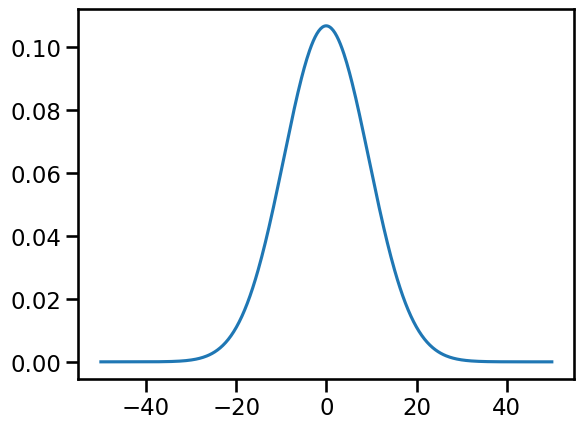

In [109]:
fig, ax = plt.subplots()
finevels = np.linspace(-50, 50, 500)
ax.plot(finevels, kernel10000(finevels))

In [110]:
kernel1000(finevels).sum(), kernel10000(finevels).sum()

(12.508075090408692, 12.52058247084919)

Now combine the two temperature components

In [111]:
fine_dv = np.diff(finevels)[0]

In [112]:
omega = 0.5
profile_2temp = (
    omega * kernel1000(finevels) / np.sum(kernel1000(finevels))
    + (1 - omega) * kernel10000(finevels) / np.sum(kernel10000(finevels))
) / fine_dv

And compare with the one-temperature version with 6000 K

In [113]:
sig_6000 = sig0.value * np.sqrt(0.6 * (1 - 1/16))
kernel6000 = models.Gaussian1D(
    amplitude=1, 
    mean=0,
    stddev=sig_6000,
)
profile_1temp = kernel6000(finevels) / np.sum(kernel6000(finevels))
profile_1temp /= fine_dv

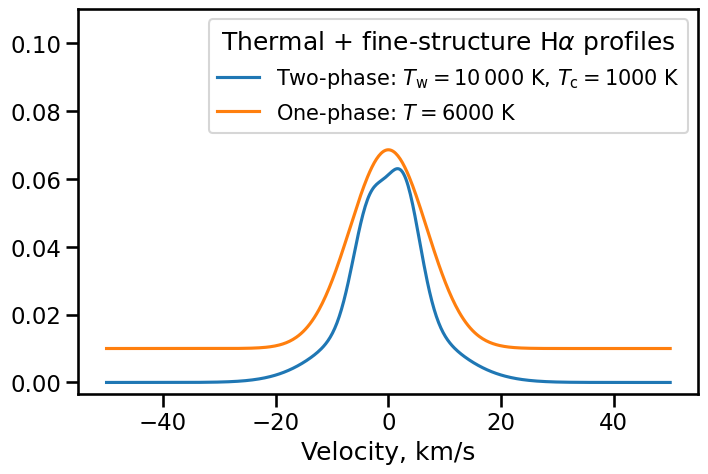

In [114]:
fig, ax = plt.subplots(figsize=(8, 5))
finevels = np.linspace(-50, 50, 500)
ax.plot(
    finevels, profile_2temp, 
    label=r"Two-phase: $T_\mathrm{w} = 10\,000$ K, $T_\mathrm{c} = 1000$ K"
)
ax.plot(
    finevels, profile_1temp + 0.01, 
    label=r"One-phase: $T = 6000$ K",
)
ax.legend(fontsize="small", title=r"Thermal + fine-structure H$\alpha$ profiles")
ax.set_ylim(None, 0.11)
ax.set_xlabel("Velocity, km/s")
figfile = "pn-ou5-two-temperature-kernel.pdf"
fig.savefig(figfile, bbox_inches="tight")
fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

## Calculate profiles with discrete gaussian model

The idea here is to get away from the astropy.modeling framework, since it was making it hard to move over to the convolution part. 

Also, we want to generalise it so we can use different values of $\alpha$ (cool to warm temperature ratio) and $\omega$ (emission fraction from cool phase).

Finally, we will make sure that we use the cdf of the profile to account for the finite bin width, although that means specifying the bin width in advance

### Class to encapsulate a single phase

In [115]:
import scipy.stats

_cdf = scipy.stats.norm.cdf

def discrete_gaussian(x, amplitude, mean, stddev, bin_width):
    "Gaussian profile integrated over finite bins"
    return amplitude * (
        _cdf(x + 0.5 * bin_width, loc=mean, scale=stddev)
        - _cdf(x - 0.5 * bin_width, loc=mean, scale=stddev)
    )

class PhaseProfile():
    """Fine structure plus thermal line profile for single temperature

    Currently H alpha only. Fine structure components from Clegg 1999
    """
    DATA_PATH = Path.cwd().parent / "docs" 
    WAV_REF = 6562.8812
    # RMS thermal broadening at 1e4 K
    SIG0 = np.sqrt( 
        constants.k_B * 10_000 * u.K / constants.m_p
    ).to(u.km / u.s).value
    
    def __init__(
        self, 
        temperature,
        datafile="h-case-b-n2.csv",
        A_other=16,
        dv=0.1,
        vmax=50,
    ):
        """
        
        """
        self.temperature = temperature
        self.A_other = A_other
        self.initialize_components(Table.read(self.DATA_PATH / datafile))
        # Mean velocity over components
        self.vmean = np.average(self.vcomps, weights=self.icomps)
        # Centroid lab wavelength (in air)
        self.wav0 = self.WAV_REF * (1 + self.vmean / 3e5)
        # RMS excess thermal sigma of each component
        self.sigma = self.SIG0 * np.sqrt(
            (self.temperature / 1e4) * (1 - 1/self.A_other)
        )
        # Velocity grid for evaluating profile
        self.dv = dv
        self.nvgrid = 1 + int(2 * vmax / dv)
        self.vgrid = np.linspace(-vmax, vmax, self.nvgrid)
        self.initialize_igrid()

    def initialize_components(self, table):
        # Velocity shifts of fs components
        self.vcomps = np.array(table["d v"])
        self.ncomps = len(self.vcomps)
        # Interpolate intensities in log10(T)
        itable = Table(table.columns[3:])
        # Array of log T from columns of intensity grid
        logTs = np.log10(list(map(float, itable.colnames)))
        # Interpolate the intensity of each component at desired T
        self.icomps = np.array([
            np.interp(
                np.log10(self.temperature),
                logTs,
                irow,
            )
            for irow in np.array(itable).tolist()
        ])
        
    def initialize_igrid(self):
        self.igrid = np.zeros_like(self.vgrid)
        for _icomp, _vcomp in zip(self.icomps, self.vcomps):
            self.igrid += discrete_gaussian(
                self.vgrid,
                _icomp,
                _vcomp,
                self.sigma,
                self.dv,
            ) / self.dv
        



In [116]:
prof = PhaseProfile(1e2)

In [117]:
prof.vgrid

array([-50. , -49.9, -49.8, ...,  49.8,  49.9,  50. ])

### Plot the profiles for different T

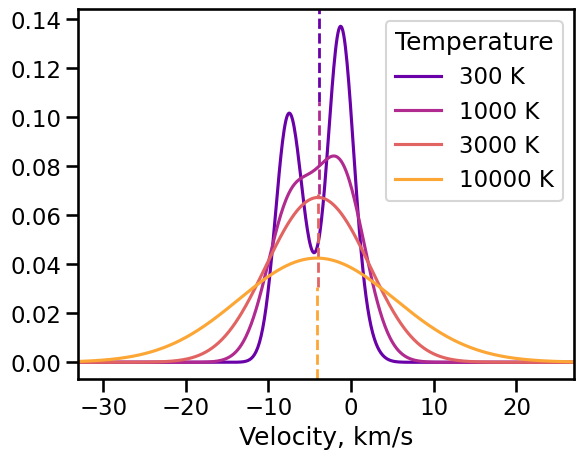

In [118]:
# Tlist = [100, 200, 500, 1000, 2000, 5000, 10000]
Tlist = [300, 1000, 3000, 10000]
nT = len(Tlist)
with sns.color_palette("plasma", n_colors=nT):
    fig, ax = plt.subplots()
    for _i, T in enumerate(Tlist):
        p = PhaseProfile(T, dv=0.1)
        line, = ax.plot(p.vgrid, p.igrid, label=f"{T} K")
        ax.axvline(p.vmean, color=line.get_color(), 
                   lw=2, ymax=1 - (_i/nT), ymin=1 - (1+_i)/nT,
                   ls="dashed",
                  )
    ax.set_xlim(-33, 27)
    ax.legend(ncol=1, title="Temperature")
    ax.set_xlabel("Velocity, km/s")
    figfile = "pn-ou5-fine-structure-ha.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

### Class to encapsulate two phases

In [119]:
class TwoPhaseProfile():
    def __init__(self, alpha, omega, Twarm=1e4, dv=0.1):
        self.Twarm = Twarm
        self.alpha = alpha
        self.omega = omega
        self.Tcool = alpha * Twarm
        self.warm = PhaseProfile(self.Twarm, dv=dv)
        self.cool = PhaseProfile(self.Tcool, dv=dv)
        self.vgrid = self.warm.vgrid
        self.igrid = (
            (1 - self.omega) * self.warm.igrid 
            + self.omega * self.cool.igrid
        )
        self.vmean = np.average(self.vgrid, weights=self.igrid)

    def __call__(self, v):
        """Interpolated profile at velocity shift `v` centered on mean
        """
        return np.interp(v + self.vmean, self.vgrid, self.igrid)



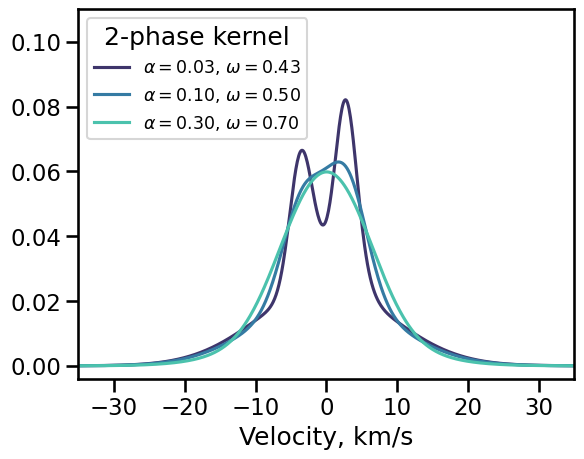

In [120]:
alist = 0.03, 0.1, 0.3
with sns.color_palette("mako", n_colors=len(alist)):
    fig, ax = plt.subplots()
    for alpha in alist:
        omega = 0.4 + alpha
        p = TwoPhaseProfile(alpha, omega, dv=0.1)
        line, = ax.plot(p.vgrid - p.vmean, p.igrid,
                        label=fr"$\alpha = {alpha:.2f}$, $\omega = {omega:.2f}$")
    ax.legend(fontsize="x-small", loc="upper left", title="2-phase kernel")
    ax.set_xlim(-35, 35)
    ax.set_ylim(None, 0.11)
    ax.set_xlabel("Velocity, km/s")
    figfile = "pn-ou5-two-phase-alpha.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")


Test that the interpolation function works. Plot on a coarser grid

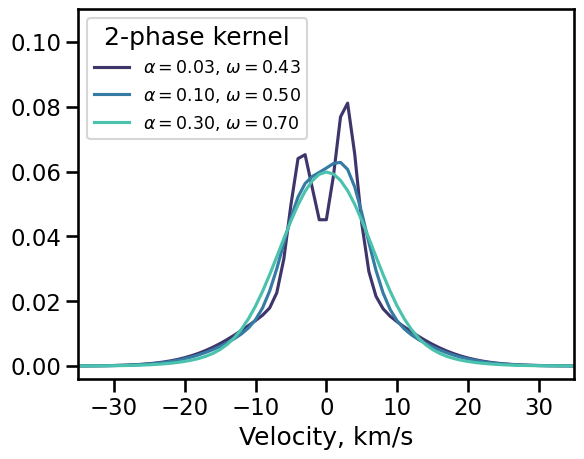

In [121]:
alist = 0.03, 0.1, 0.3
vgrid = np.linspace(-50, 50, 101)
with sns.color_palette("mako", n_colors=len(alist)):
    fig, ax = plt.subplots()
    for alpha in alist:
        omega = 0.4 + alpha
        p = TwoPhaseProfile(alpha, omega, dv=0.1)
        line, = ax.plot(vgrid, p(vgrid),
                        label=fr"$\alpha = {alpha:.2f}$, $\omega = {omega:.2f}$")
    ax.legend(fontsize="x-small", loc="upper left", title="2-phase kernel")
    ax.set_xlim(-35, 35)
    ax.set_ylim(None, 0.11)
    ax.set_xlabel("Velocity, km/s")
    # figfile = "pn-ou5-two-phase-alpha.pdf"
    # fig.savefig(figfile, bbox_inches="tight")
    # fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")


### Test the affect of the typical instrumental plus non-thermal broadening on the 2-phase profile

The typical sigma from the [O III] gaussian fits is 7 km/s, so we can convolve the 2-phase profile with this to get an idea of what the individual Ha velocity components are predicted to look like

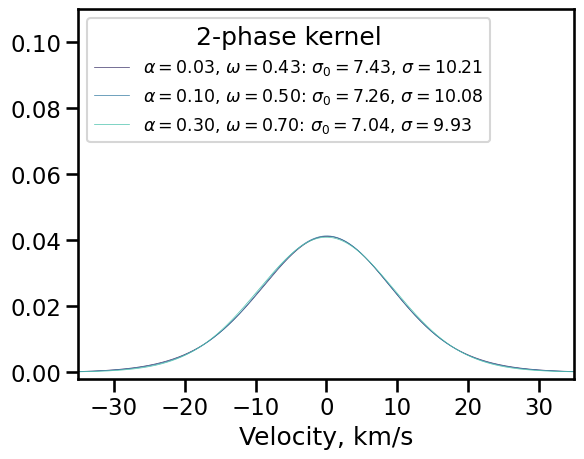

In [122]:
def std_dev(x, y):
    xm = np.average(x, weights=y)
    xvar = np.average((x - xm)**2, weights=y)
    return np.sqrt(xvar)
    


alist = 0.03, 0.1, 0.3
vgrid = np.linspace(-50, 50, 1001)
vgrid_spacing = np.diff(vgrid)[0]
with sns.color_palette("mako", n_colors=len(alist)):
    fig, ax = plt.subplots()
    for alpha in alist:
        omega = 0.4 + alpha
        p = TwoPhaseProfile(alpha, omega, dv=0.1)
        std0 = std_dev(vgrid, p(vgrid))
        sprofile = convolve(
            p(vgrid),
            Gaussian1DKernel(stddev=7.0 / vgrid_spacing, mode="oversample"),
        )
        std = std_dev(vgrid, sprofile)
        label = (
            fr"$\alpha = {alpha:.2f}$, $\omega = {omega:.2f}$"
            fr": $\sigma_0 = {std0:.2f}$, $\sigma = {std:.2f}$"
        )
        line, = ax.plot(vgrid, sprofile, label=label, lw=0.5)
    ax.legend(fontsize="x-small", loc="upper left", title="2-phase kernel")
    ax.set_xlim(-35, 35)
    ax.set_ylim(None, 0.11)
    ax.set_xlabel("Velocity, km/s")

So this shows that there is almost no perceptible difference between the different 2-phase models once we convolve them with the instrumental + non-thermal profile. Everything comes out looking like a gaussian with a total sigma of about 10 km/s, which is consistent with the component widths of the Ha gaussian decomposition. (See 04-02 notebook)

### Make a smoothing kernel from 2-phase model

Convenience wrapper function for the class

In [123]:
def two_phase_profile(v, alpha=0.1, omega=0.5, Twarm=1e4):
    _profile = TwoPhaseProfile(alpha, omega, Twarm)
    return _profile(v)

Try to use `astropy.convolution.utils.discretize_model`, which supposedly can be used with any callable. If we make an instance of `TwoPhaseProfile` first, then that will be our callable. 

*We still need to worry about pixel verus velocity units*

In [124]:
from astropy.convolution.utils import discretize_model

In [125]:
p = TwoPhaseProfile(alpha=0.03, omega=0.43)
PIXEL_SIZE = 2
def pixel_profile(x):
    return p(PIXEL_SIZE * x)
x_range = (-20, 21)
kernel_ce = discretize_model(pixel_profile, x_range, mode="center")
kernel_li = discretize_model(pixel_profile, x_range, mode="linear_interp")
kernel_os = discretize_model(pixel_profile, x_range, mode="oversample")
kernel_in = discretize_model(pixel_profile, x_range, mode="integrate")

/Users/will/Dropbox/teresa-pn-ou5/.venv/lib/python3.11/site-packages/astropy/convolution/utils.py:327: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  values = np.append(values, quad(model, x[i], x[i + 1])[0])
/Users/will/Dropbox/teresa-pn-ou5/.venv/lib/python3.11/site-packages/astropy/convolution/utils.py:327: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  values = np.append(values, quad(model, x[i], x[i + 1])[0])


Text(0.5, 0, 'Pixel')

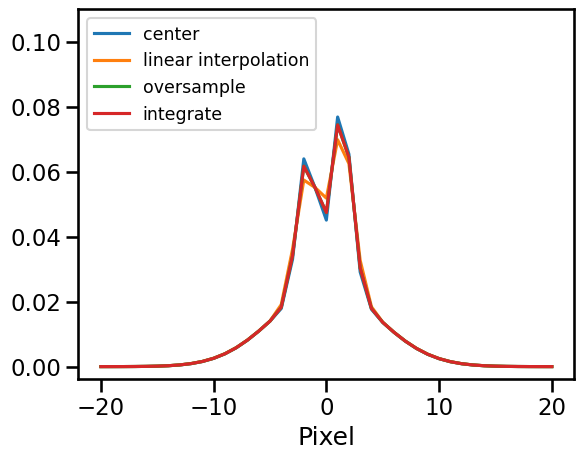

In [126]:
fig, ax = plt.subplots()
x_arr = np.arange(*x_range)
ax.plot(x_arr, kernel_ce, label="center")
ax.plot(x_arr, kernel_li, label="linear interpolation")
ax.plot(x_arr, kernel_os, label="oversample")
ax.plot(x_arr, kernel_in, label="integrate")
ax.legend(fontsize="x-small", loc="upper left")
ax.set_ylim(None, 0.11)
ax.set_xlabel("Pixel")

In [127]:
from astropy.convolution import CustomKernel

In [128]:
kernel = CustomKernel(kernel_os)

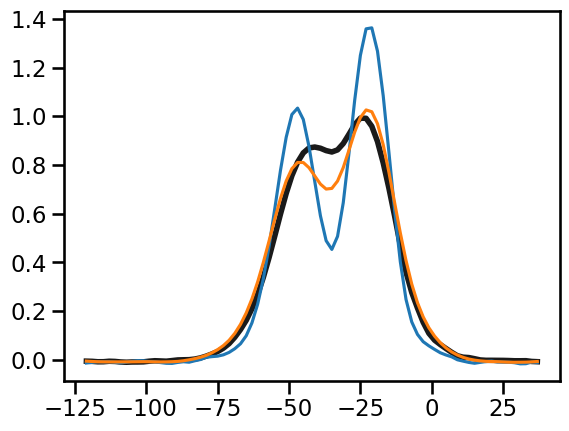

In [129]:
fig, ax = plt.subplots()

ax.plot(vels, vprofiles["ha"], lw=4, color="k")
ax.plot(vels, vprofiles["oiii"])

sprofile = convolve(vprofiles["oiii"], kernel)
ax.plot(vels, sprofile)

Well that seems to fit pretty well. Which is a shame if we want to rule out a low-T phase

## Repeat convolution with [O III] but for two-phase model

We will generate the same graphs that we did for the gaussian case

### Optimum cool fraction $\omega$ for different cool temperatures

#### $\alpha = 0.03$

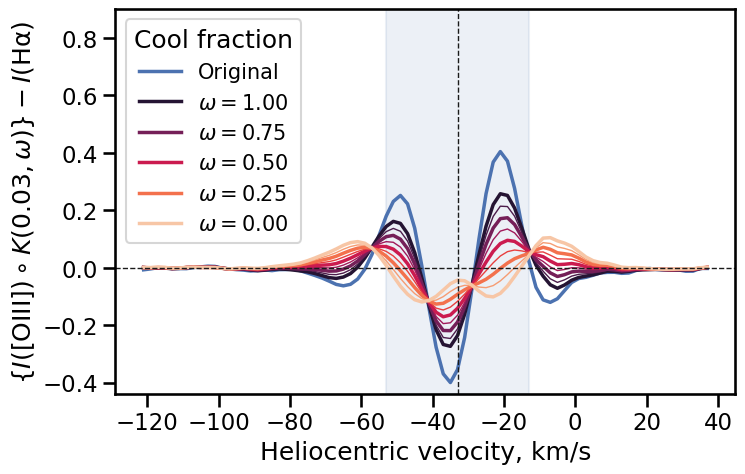

In [130]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.03
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a003-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

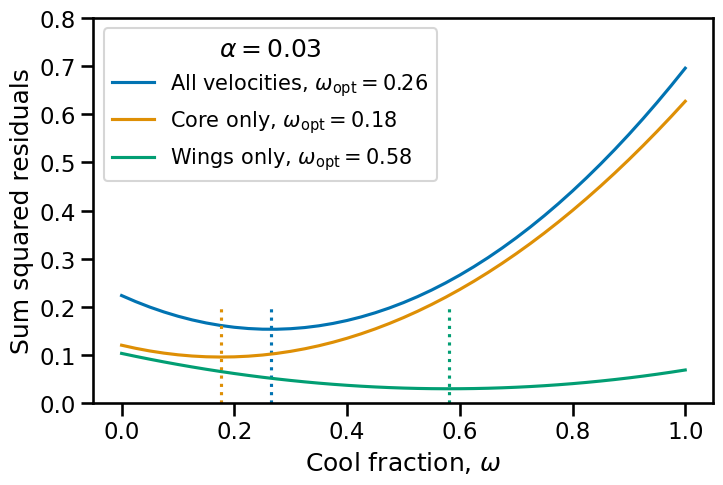

In [131]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a003-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [132]:
min(sum_square_residuals)

0.15342855667655972

#### $\alpha = 0.1$

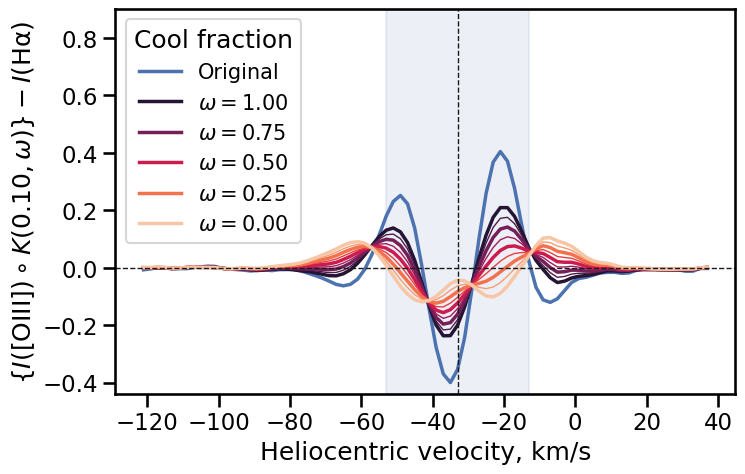

In [133]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.1
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a010-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

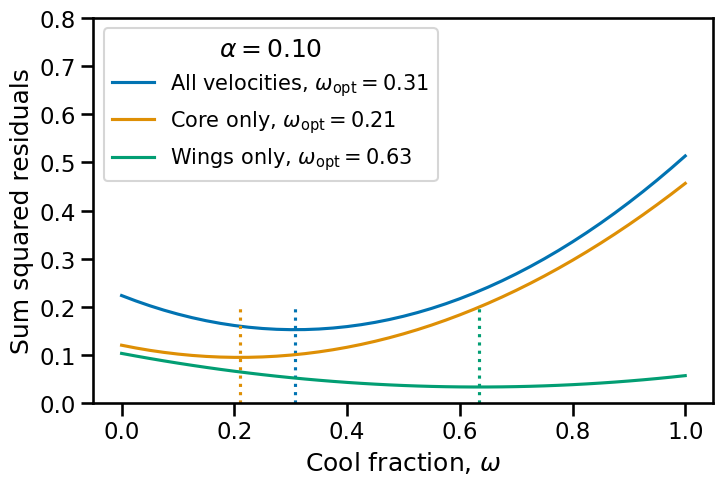

In [134]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a010-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [135]:
min(sum_square_residuals)

0.1525651160872893

Optimum is very slightly better for $\alpha = 0.1$ than for $\alpha = 0.03$

#### $\alpha = 0.3$

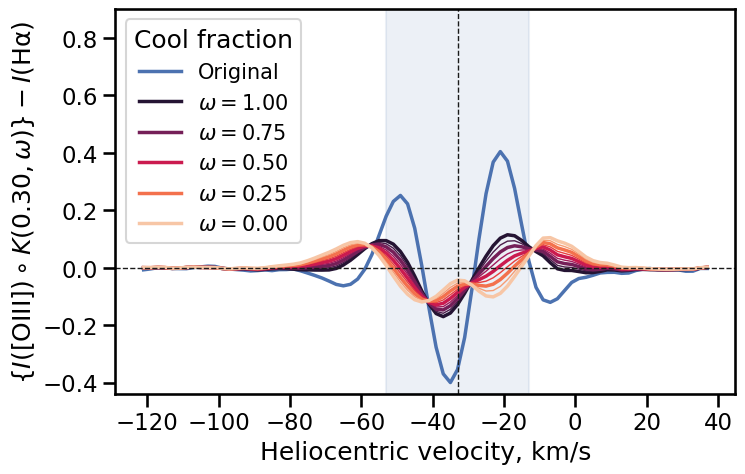

In [136]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.3
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a030-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

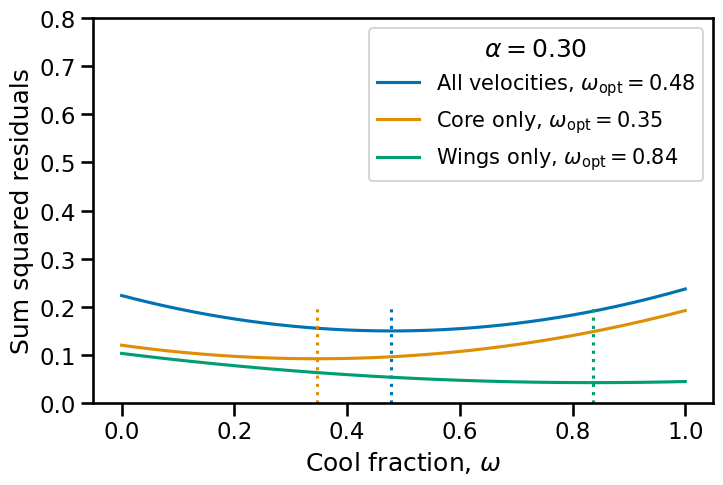

In [137]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a030-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [138]:
min(sum_square_residuals)

0.14992594595528852

Optimum is even better for $\alpha = 0.3$, but I am not sure I believe it

#### $\alpha = 0.5$

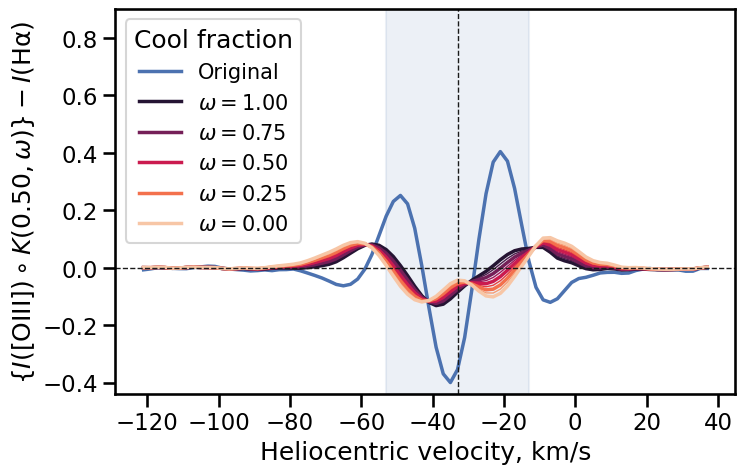

In [139]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.5
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a050-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

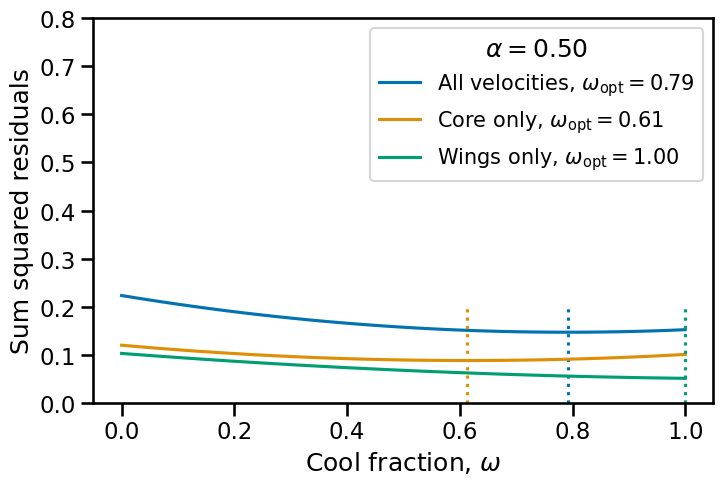

In [140]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a050-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [141]:
min(sum_square_residuals)

0.1472590524433139

#### $\alpha = 0.7$

This one is ridiculous really, but I just want the residuals to start increasing

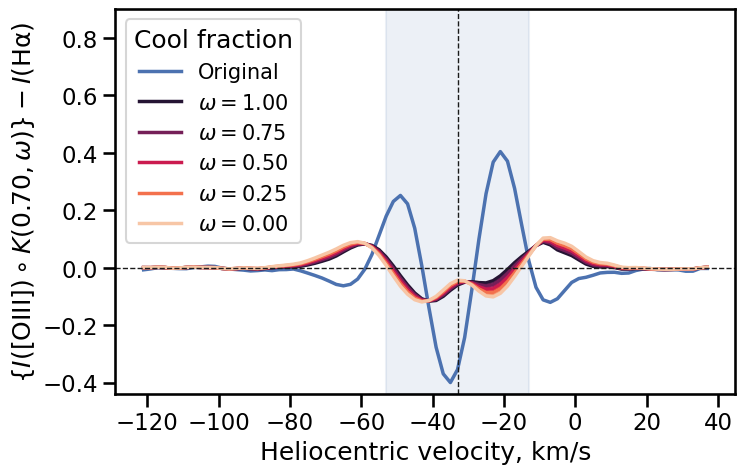

In [142]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.7
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a070-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

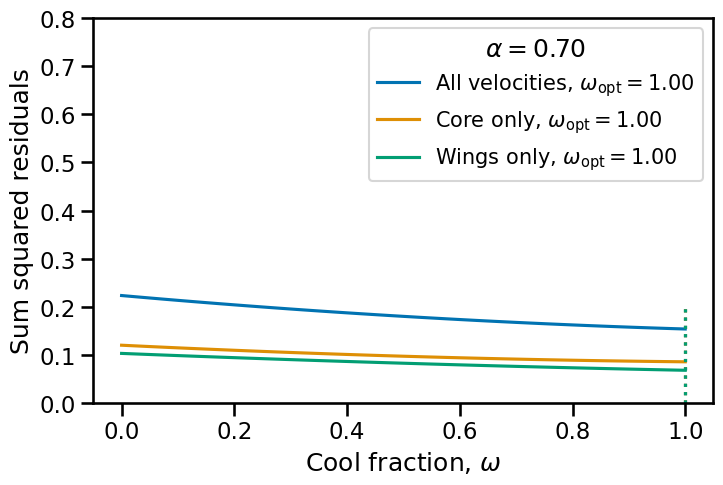

In [143]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a070-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [144]:
min(sum_square_residuals)

0.1539357722296057

#### $\alpha = 0.9$

This one is ridiculous really, but I just want the residuals to start increasing

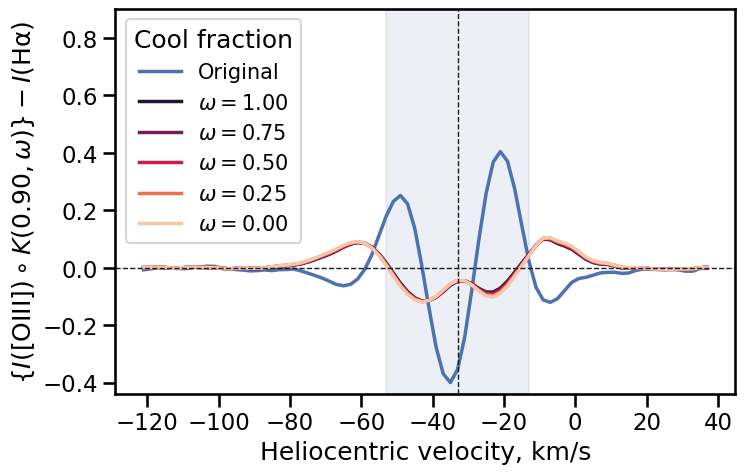

In [145]:
om_list = np.linspace(0.0, 1.0, 41)[::-1]
skip = 5
alpha = 0.9
with sns.color_palette("rocket", 1 + len(om_list) // skip):
    fig, ax = plt.subplots(figsize=(8, 5))
    sum_square_residuals = []
    sum_square_residuals_core = []
    sum_square_residuals_wings = []
    core_width = 20
    core = np.abs(vels + 33) < core_width
    ax.plot(vels,  vprofiles["oiii"]- vprofiles["ha"], label="Original", lw=2.5, color="b")
    for index, omega in enumerate(om_list):
        if omega is not None:
            p = TwoPhaseProfile(alpha=alpha, omega=omega)
            kernel = CustomKernel(
                discretize_model(pixel_profile, x_range, mode="oversample")
            )
            sprofile = convolve(vprofiles["oiii"], kernel)
        else:
            sprofile = vprofiles["oiii"]
        residuals = sprofile - vprofiles["ha"]
        if index % skip == 0:
            if index % (skip*2) == 0:
                label = f"$\omega = {omega:.2f}$"
                lw = 2.5
            else:
                label = None
                lw = 1.0
            ax.plot(vels, residuals, label=label, lw=lw)
        sum_square_residuals.append(np.sum(residuals**2))
        sum_square_residuals_core.append(np.sum(residuals[core]**2))
        sum_square_residuals_wings.append(np.sum(residuals[~core]**2))
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.axhline(0, ls="dashed", color="k", lw=1)
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.legend(fontsize="small", title="Cool fraction")
    ax.set_ylim(None, 0.9)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.set_ylabel(rf"$ \left\{{ I(\mathrm{{[O III]}}) \circ K({alpha:.2f}, \omega) \right\}} - I(\mathrm{{H\alpha}})$")
    figfile = "pn-ou5-2phase-a090-convolution-residuals.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

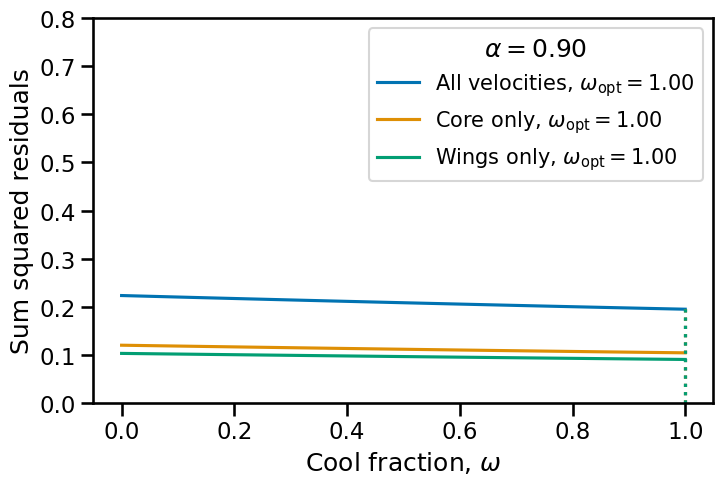

In [146]:
with sns.color_palette("colorblind", n_colors=3):
    fig, ax = plt.subplots(figsize=(8, 5))
    om_opt = np.interp(0.0, np.gradient(sum_square_residuals), om_list)
    label = f"All velocities, $\omega_\mathrm{{opt}} = {om_opt:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals, label=label)
    c = line.get_color()
    ax.axvline(om_opt, linestyle="dotted", color=c, ymax=0.25)
    
    om_opt_core = np.interp(0.0, np.gradient(sum_square_residuals_core), om_list)
    label = f"Core only, $\omega_\mathrm{{opt}} = {om_opt_core:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_core, label=label)
    c = line.get_color()
    ax.axvline(om_opt_core, linestyle="dotted", color=c, ymax=0.25)

    om_opt_wings = np.interp(0.0, np.gradient(sum_square_residuals_wings), om_list)
    label = f"Wings only, $\omega_\mathrm{{opt}} = {om_opt_wings:.2f}$"
    line, = ax.plot(om_list, sum_square_residuals_wings, label=label)
    c = line.get_color()
    ax.axvline(om_opt_wings, linestyle="dotted", color=c, ymax=0.25)
    
    ax.set_ylim(0.0, 0.8)
    ax.set_xlabel(r"Cool fraction, $\omega$")
    ax.set_ylabel("Sum squared residuals")
    ax.legend(fontsize="small", title=rf"$\alpha = {alpha:.2f}$")
    figfile = "pn-ou5-2phase-a090-convolution-optimum.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

In [147]:
min(sum_square_residuals)

0.1950655187963194

### Variation with $\alpha$

Taking the results from the previous section

In [148]:
Table(
    {
        "alpha": [0.03, 0.1, 0.3, 0.5, 0.7, 0.9],
        "om_opt": [0.21, 0.36, 0.48, 0.79, 1.0, 1.0],
        "om_opt_wings": [0.58, 0.63, 0.84, 1.0, 1.0, 1.0],        
        "chi^2": [0.153, 0.153, 0.150, 0.147, 0.154, 0.195],
    }
)

alpha,om_opt,om_opt_wings,chi^2
float64,float64,float64,float64
0.03,0.21,0.58,0.153
0.1,0.36,0.63,0.153
0.3,0.48,0.84,0.15
0.5,0.79,1.0,0.147
0.7,1.0,1.0,0.154
0.9,1.0,1.0,0.195


So there really is no significant variation in the goodness of fit, except when we put the T of the cool component above 7000 K. 

Formally, the best fit is for $\alpha = 0.5$, $\omega = 0.8$

### Illustrations of the convolved 2-phase profiles

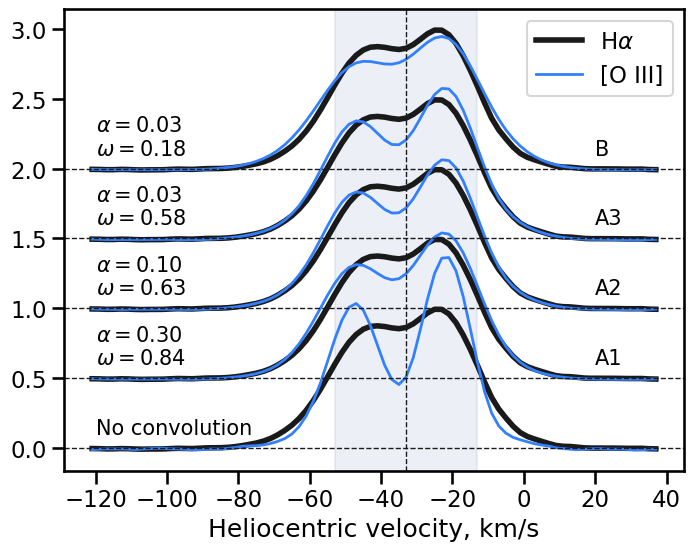

In [149]:
sns.set_color_codes()
with sns.color_palette("dark"):

    fig, ax = plt.subplots(figsize=(8, 6))
    ds = "default"
    #ds = "steps-mid"
    olw, hlw = 2, 4
    ocolor = (0.2, 0.5, 1.0)
    offset_step = 0.5
    offset = 0
    ax.plot(vels, offset + vprofiles["ha"], lw=hlw, color="k", ds=ds, label=r"H$\alpha$")
    ax.plot(vels, offset + vprofiles["oiii"], color=ocolor, lw=olw, ds=ds, label="[O III]")
    text = "No convolution"
    ax.text(-120, offset + 0.1, text, fontsize="small")
    ax.axhline(offset, ls="dashed", color="k", lw=1)

    for alpha, omega, label in [
        [0.3, 0.84, "A1"],
        [0.1, 0.63, "A2"],
        [0.03, 0.58, "A3"],
        [0.03, 0.18, "B"],
    ]:
            
        offset += offset_step
        p = TwoPhaseProfile(alpha=alpha, omega=omega)
        kernel = CustomKernel(
            discretize_model(pixel_profile, x_range, mode="oversample")
        )
        sprofile = convolve(vprofiles["oiii"], kernel)
        ax.plot(vels, offset + vprofiles["ha"], lw=hlw, color="k")
        ax.plot(vels, offset + sprofile, color=ocolor, lw=olw)
        text = (rf"$\alpha = {alpha:.2f}$" 
                + "\n" + rf"$\omega = {omega:.2f}$")
        ax.text(-120, offset + 0.1, text, fontsize="small")
        ax.text(20, offset + 0.1, label, fontsize="small")
        ax.axhline(offset, ls="dashed", color="k", lw=1)
    
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.set_xlabel("Heliocentric velocity, km/s")
    ax.legend()
    
    figfile = "pn-ou5-2phase-convolution-fits.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

So these show convolved fits that are extremely similar to the Gaussian ones. The top profile is optimised or core and shows clear excess in the wings

The other profiles (optimised for wings) show the degeneracy between $\alpha$ and $\omega$ (only depends on approx $\omega - \alpha$). 

The irreducible residuals are again due to the expansion profile slightly more split for [O III] than for H alpha.

### Tangent-point 70 micron: convolved 2-phase profiles

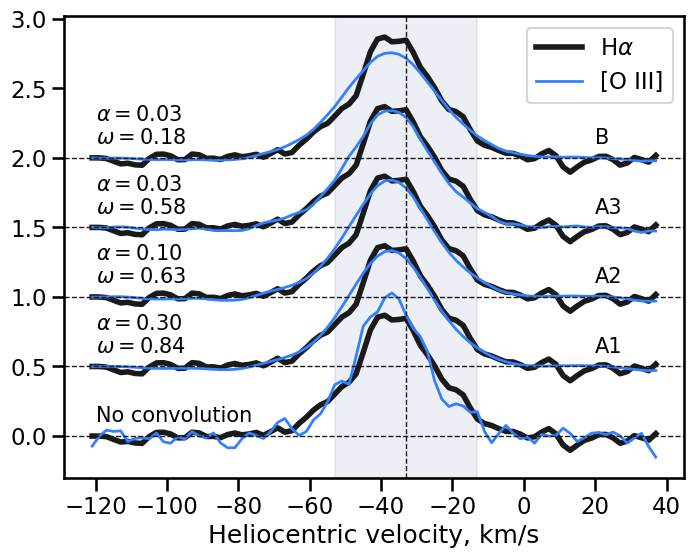

In [199]:
sns.set_color_codes()
with sns.color_palette("dark"):

    fig, ax = plt.subplots(figsize=(8, 6))
    ds = "default"
    #ds = "steps-mid"
    olw, hlw = 2, 4
    ocolor = (0.2, 0.5, 1.0)
    offset_step = 0.5
    offset = 0
    ax.plot(vels, offset + vprofiles_tp70["ha"], lw=hlw, color="k", ds=ds, label=r"H$\alpha$")
    ax.plot(vels, offset + vprofiles_tp70["oiii"], color=ocolor, lw=olw, ds=ds, label="[O III]")
    text = "No convolution"
    ax.text(-120, offset + 0.1, text, fontsize="small")
    ax.axhline(offset, ls="dashed", color="k", lw=1)

    for alpha, omega, label in [
        [0.3, 0.84, "A1"],
        [0.1, 0.63, "A2"],
        [0.03, 0.58, "A3"],
        [0.03, 0.18, "B"],
    ]:
            
        offset += offset_step
        p = TwoPhaseProfile(alpha=alpha, omega=omega)
        kernel = CustomKernel(
            discretize_model(pixel_profile, x_range, mode="oversample")
        )
        sprofile = convolve(vprofiles_tp70["oiii"], kernel)
        ax.plot(vels, offset + vprofiles_tp70["ha"], lw=hlw, color="k")
        ax.plot(vels, offset + sprofile, color=ocolor, lw=olw)
        text = (rf"$\alpha = {alpha:.2f}$" 
                + "\n" + rf"$\omega = {omega:.2f}$")
        ax.text(-120, offset + 0.1, text, fontsize="small")
        ax.text(20, offset + 0.1, label, fontsize="small")
        ax.axhline(offset, ls="dashed", color="k", lw=1)
    
    ax.axvspan(-33 - core_width, -33 + core_width, color="b", alpha=0.1, zorder=-100)
    ax.axvline(-33, ls="dashed", color="k", lw=1)
    ax.set_xlabel("Heliocentric velocity, km/s")

    ax.legend()
    
    figfile = "pn-ou5-2phase-tp70-convolution-fits.pdf"
    fig.savefig(figfile, bbox_inches="tight")
    fig.savefig(figfile.replace(".pdf", ".jpg"), bbox_inches="tight")

# Some comments on the results

Components

## Inner lobes

Red component is brighter than blue.

## Outer lobes

Bend towards blue on both sides (N and S)

## Equatorial high velocity wings
More obvious in oiii. 

## Polar knots




That seems to have worked fine.  Now we will try it with a pre-defined common grid. Say, 1 km/s and 0.2 arcsec.

Helium lines. Not very good.

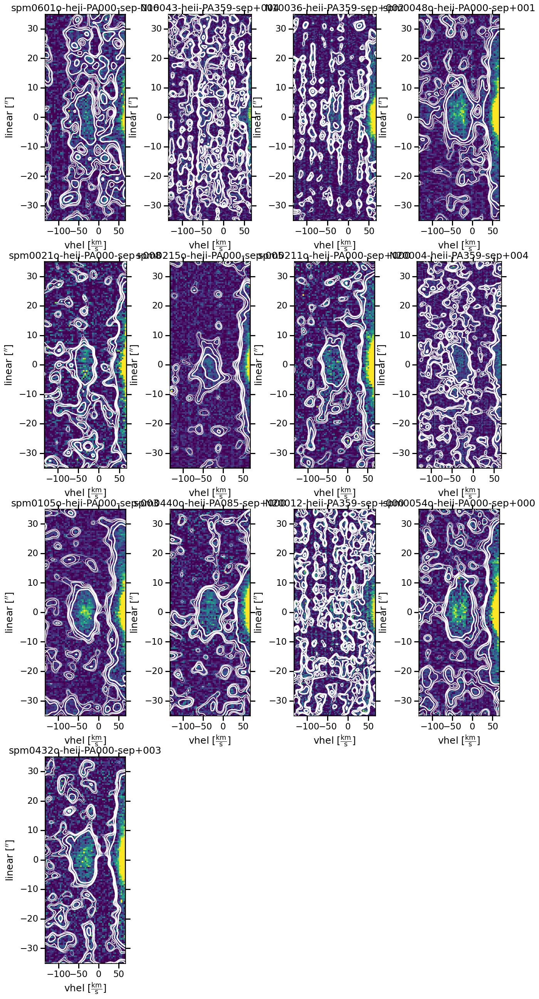

In [150]:
file_list = list(pvpath.glob("*-heii-*.fits"))
N = len(file_list)
ncols = 4
nrows = (N // ncols) + 1
fig = plt.figure(figsize=(4 * ncols, 8 * nrows))

vsys = -33
v1, v2 = vsys - 100, vsys + 100
s1, s2 = -35, 35

kernel = Gaussian2DKernel(x_stddev=2.0)
for i, filepath in enumerate(file_list):
    hdu, = fits.open(filepath)
    w = WCS(hdu.header)
    ax = plt.subplot(nrows, ncols, i + 1, projection=w)
    xlims, ylims = w.world_to_pixel_values([v1, v2], [s1, s2])
    y1, y2 = [int(_) for _ in ylims]
    x1, x2 = [int(_) for _ in xlims]
    bg1 = np.median(hdu.data[y1-10:y1], axis=0)
    bg2 = np.median(hdu.data[y2:y2+10], axis=0)
    im = hdu.data - 0.5 * (bg1 + bg2)
    x0, _ = w.world_to_pixel_values(0.0, 0.0)
    x0 = int(x0)
    im /= im[y1:y2, x1:x0].max()
    ax.imshow(im, vmin=-0.1, vmax=1.0)
    ims = convolve_fft(im, kernel)
    ax.contour(
        ims, 
        levels=[0.005, 0.01, 0.02, 0.04, 0.08], 
        colors="w",
        linewidths=[0.5, 1.0, 1.5, 2.0, 2.5],
    )

    ax.set(xlim=xlims, ylim=ylims)
    ax.set_title(filepath.stem)
...;

In [151]:
x1, x2, x0

(26, 77, 60)

In [152]:
y1, y2

(255, 388)

In [153]:
im[y1:y2, x1:x2].max()

3.3866057

# Things that did not work

Make a `Fittable1DModel` for the profile, so we can then convert it into a convolution kernel. We can't just use the decorator since that makes a `FittableModel` instead, which does not work with the convolution `Model1DKernel`. We also need to worry about the pixel size, since the convolution is always done in pixel units

In [154]:
from astropy.modeling import Fittable1DModel, Parameter

class TwoPhaseModel(Fittable1DModel):
    alpha = Parameter()
    omega = Parameter()
    Twarm = Parameter()

    @staticmethod
    def evaluate(x, alpha, omega, Twarm):
        return two_phase_profile(x, alpha, omega, Twarm)

    @staticmethod
    def fit_deriv(x, alpha, omega, Twarm):
        return None

This does not seem to work

In [157]:
# model = TwoPhaseModel(alpha=0.1, omega=0.5, Twarm=1)

In [158]:
# kernel = Model1DKernel(model, x_size=101, mode="oversample")